## Analyze TriOS Data

Uncertainty, comparing to TSG, and 

In [ ]:
chla, b, c, caro, hex fuco, fuco, zea

In [1]:
import xarray as xr
import numpy as np

import hvplot.xarray


import cartopy.crs as crs

import pandas as pd
import geopandas as gpd

import glob
import hvplot.pandas  # noqa
from datetime import timedelta
from datetime import datetime
import matplotlib.pyplot as plt

from sklearn.preprocessing import StandardScaler

from sklearn.decomposition import PCA

In [2]:
df = pd.read_csv("data/ivan_cruise/SW21009R_NRL/EventData/DataLogger/Data every 1 min_001.elg")
df.head()

,Date,Time,SW-ZDA-Year,SW-ZDA-Month,SW-ZDA-Day,SW-ZDA-Time,SW-GGA-Lat,SW-GGA-NorS,SW-GGA-Long,SW-GGA-EorW,...,SW-Weather-HumidRel-%,SW-Wind-WindSpeedRel,SW-Wind-WindAngleRel,TrueWind-DRV-SPEED,TrueWind-DRV-DIRECTION,TSG--temp-SBE38,TSG--sal,SW-Depth-DBT-Depth below transducer (m),DepthOverall-DRV-VALUE,Unnamed: 24
0,08/25/2021,12:46:24,2021,8,25,124935.70,3433.3240,N,7610.8499,W,...,76.1,5.00,76.40,10.75,219.05,27.7042,35.6590,36.91,37.88,NaN
1,08/25/2021,12:47:25,2021,8,25,125035.70,3433.4081,N,7610.6764,W,...,75.7,4.49,86.89,12.15,215.33,27.6905,35.6585,37.36,38.36,NaN
2,08/25/2021,12:48:25,2021,8,25,125135.70,3433.4919,N,7610.5111,W,...,75.2,3.29,95.20,11.20,214.90,27.6949,35.6639,37.80,38.80,NaN
3,08/25/2021,12:49:25,2021,8,25,125235.69,3433.5739,N,7610.3362,W,...,75.6,5.29,80.90,12.10,213.94,27.6968,35.6928,36.98,37.98,NaN
4,08/25/2021,12:50:25,2021,8,25,125336.69,3433.6615,N,7610.1648,W,...,75.3,2.90,99.29,11.44,221.88,27.6971,35.6891,36.95,37.95,NaN


In [70]:
nav_df = pd.read_csv('data/ivan_cruise/SW21009R_NRL/Navigation/SW-GGA_20210825-082425.Raw',  names=['Date', 'Time', 'GPGGA','Unknown', 'SW-GGA-Lat', 'latdir', 'SW-GGA-Long', 'londir', '1', '2', '3', '4', '5', '6', '7'])

def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

nav_df['lon'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
nav_df['lat'] = dms2dd(pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(nav_df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

date_time_strs = nav_df['Date'] + ' ' + nav_df['Time']

nav_df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S.%f') for x in date_time_strs]
nav_df['utc_dt'] = nav_df['datetime']
nav_df  = nav_df.set_index('utc_dt')
tsg_df = pd.read_csv('data/ivan_cruise/SW21009R_NRL/TSG/TSG-_20210825-082425.Raw', names=['DateTime', 'Temp','Sal','Unknown'], delim_whitespace=True)#sep=r"s*")# names=['Date', 'Time', 'Data'])
tsg_df
tsg_df['datetime'] = [datetime.strptime(x[:-1], '%m/%d/%Y,%H:%M:%S.%f') for x in tsg_df.DateTime]

lats = []
lons = []
for i in range(len(tsg_df)):
    row = nav_df.iloc[nav_df.index.get_loc(tsg_df.iloc[i].datetime, method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
tsg_df['lat'] = lats
tsg_df['lon'] = lons

tsg_df['utc_dt'] = tsg_df['datetime']
tsg_df  = tsg_df.set_index('utc_dt')

In [77]:
tsg_df.head()

,DateTime,Temp,Sal,Unknown,datetime,lat,lon
utc_dt,,,,,,,
2021-08-25 08:24:35.600,"08/25/2021,08:24:35.600,",29.4365,0.2873,1509.65,2021-08-25 08:24:35.600,34.717578,-76.670570
2021-08-25 08:24:45.596,"08/25/2021,08:24:45.596,",29.4352,0.2874,1509.65,2021-08-25 08:24:45.596,34.717578,-76.670567
2021-08-25 08:24:55.599,"08/25/2021,08:24:55.599,",29.4351,0.2874,1509.65,2021-08-25 08:24:55.599,34.717582,-76.670563
2021-08-25 08:25:05.594,"08/25/2021,08:25:05.594,",29.4339,0.2874,1509.64,2021-08-25 08:25:05.594,34.717580,-76.670568
2021-08-25 08:25:15.597,"08/25/2021,08:25:15.597,",29.4330,0.2874,1509.64,2021-08-25 08:25:15.597,34.717578,-76.670573


In [71]:
tsg_df = tsg_df.sort_index(ascending=True)

In [76]:
len(tsg_df)

6.229479515964426

In [82]:
# about 5 days
len(tsg_df) / 60 / 24 / 6

4.94537037037037

In [3]:
len(df)

6859

In [4]:
# about 5 days
len(df) / 60 / 24 / 60

4.763194444444444

The ship's computer was about 4 minutes behind so adding that here. Will fix this by using the data stamped by the GPS clock.

In [5]:
date_time_strs = df['Date'] + ' ' + df['Time']

df['datetime'] = [datetime.strptime(x, '%m/%d/%Y %H:%M:%S') for x in date_time_strs]
df['utc_dt'] = df['datetime']+ timedelta(minutes=4)
df  = df.set_index('utc_dt')

Convert their format into the lat and lon format that is easier to work with in geopandas and python

In [6]:
def dms2dd(degrees, minutes, seconds, direction):
    dd = degrees + minutes/60 + seconds/(60*60);
    if direction == 'W' or direction == 'S':
        dd *= -1
    return dd;

df['lon'] = dms2dd(pd.to_numeric(df['SW-GGA-Long'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Long'].astype(str).str[2:]),np.array(0), 'W')
df['lat'] = dms2dd(pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[:2]).astype(float), pd.to_numeric(df['SW-GGA-Lat'].astype(str).str[2:]),np.array(0), 'E')

<AxesSubplot:>

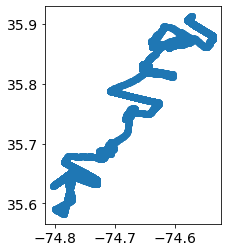

In [84]:
gdf = gpd.GeoDataFrame(
    tsg_df, geometry=gpd.points_from_xy(tsg_df.lon, tsg_df.lat))
gdf.loc['2021-08-27 8:00:00':'2021-08-27 23:45:00'].plot()

In [85]:
df.hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

In [86]:
cdom_files = [
    'data/ivan_cruise/cdom/cdom_flu_output_210825_1.txt',
    'data/ivan_cruise/cdom/cdom_flu_output_210826_1.txt',
    'data/ivan_cruise/cdom/cdom_flu_output_210827_1.txt',
    'data/ivan_cruise/cdom/cdom_flu_output_210828_1.txt',
    'data/ivan_cruise/cdom/cdom_flu_output_210829_1.txt'
             ]

cdom_dfs = []

for item in cdom_files:
    cdom_data = open(item)
    lines = cdom_data.readlines()
    sensor_values = []
    utc_times = []
    for i in range(len(lines)):
        line = lines[i]
        if "sensor" in line:
            try:
                line = line.split('= ')[1]
                line = line.replace('\n', '')
                sensor_values.append(int(line))
                if "UTC" in lines[i-1]:
                    data_time = lines[i-1][5:-2]
                    utc_times.append(data_time)
                elif "UTC" in lines[i+1]:
                    data_time = lines[i+1][5:-2]
                    utc_times.append(data_time)
            except:
                pass
    print(len(sensor_values)-len(utc_times))
    sensor_values = sensor_values[len(sensor_values)-len(utc_times):]
    utc_times = pd.to_datetime(utc_times)
    cdom_df = pd.DataFrame(np.array(sensor_values)/1024.0*5, columns = ['cdom_volts'])
    cdom_df['utc_dt'] = utc_times
    cdom_df  = cdom_df.set_index('utc_dt')
    cdom_dfs.append(cdom_df)
    
cdom_df = pd.DataFrame().append(cdom_dfs)

12
285
2
28
104


#### pull in the SST data from GOES

In [10]:
goes_ds = xr.open_dataset('data/jplStarG16SSTv270_8997_d932_2101.nc')

/srv/conda/envs/notebook/lib/python3.8/site-packages/xarray/conventions.py:492: SerializationWarning: variable 'sea_surface_temperature' has multiple fill values {-327.67, -327.68}, decoding all values to NaN.
  new_vars[k] = decode_cf_variable(


#### Pull in the TriOS radiometer data

In [87]:
trios_fns = [
    'data/ivan_cruise/trios/shearwater_trios_20210826.csv',
    'data/ivan_cruise/trios/shearwater_trios_20210827.csv',
    'data/ivan_cruise/trios/shearwater_trios_20210828.csv',
    'data/ivan_cruise/trios/shearwater_trios_20210829.csv',
            ]
trios_dfs = []
for fn in trios_fns:
    trios_dfs.append(pd.read_csv(fn))

trios_df = pd.DataFrame().append(trios_dfs)

Based on our notes I believe that the TriOS data was saved as local time so I convert it here to UTC. I have not included the offset compared to the inline but that is likely about 10 seconds or more.

In [88]:
trios_df['datetime'] = pd.to_datetime(trios_df['TimeStamp'])
trios_df['utc_dt'] =trios_df['datetime'] + timedelta(hours=4) # moving it to UTC
trios_df = trios_df.set_index('utc_dt')

<AxesSubplot:xlabel='utc_dt'>

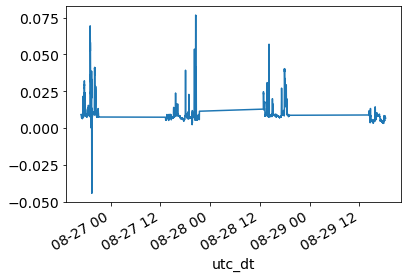

In [89]:
trios_df['400'].rolling(window=6*3).mean().plot()

In [90]:
# these are the coefficients based on the Hu et al 2012 paper

ci1 = -0.49
ci2 = 191.6590

# these are some coefficients that I calculated using the same exact method but trying to optimize for the Micasense bands

# ci1 = -0.38152295986028695
# ci2 = 271.37634868

# average of 443*.5 + 489*1.5
# ci1 = -0.30002281538304754
# ci2 = 310.5772338

# ci1 = -0.21380600002416383
# ci2 = 572.01573044



def oc_index(blue, green, red):
    blue, green, red = blue, green, red
    CI = green - ( blue + (555 - 477)/(667 - 477) * (red - blue) )
    ChlCI = 10**(ci1 + ci2*CI)
    return(ChlCI)

In [91]:
trios_df['chla_oci'] = oc_index(trios_df.iloc[:, 156:161].mean(axis=1).values, trios_df.iloc[:, 232:240].mean(axis=1).values, trios_df.iloc[:, 346:351].mean(axis=1).values)

Some of the values are way too high so cutting those off.

In [92]:
trios_df['chla_oci'][trios_df['chla_oci'] > 2 ] = np.nan

<ipython-input-92-edd115011d89>:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  trios_df['chla_oci'][trios_df['chla_oci'] > 2 ] = np.nan


(0.0, 0.4)

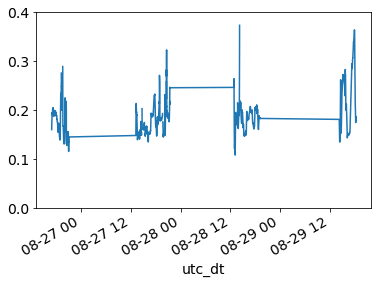

In [93]:
fig, ax = plt.subplots()
trios_df['chla_oci'].rolling(window=6*5).mean().plot(ax=ax)
ax.set_ylim(0,.4)

#### Filter all TriOS data for outliers and make dataset that is just the transects

In [94]:
start_times = ['2021-08-26 12:15:00', '2021-08-27 11:38:00', '2021-08-27 16:05:00', '2021-08-27 18:30:00', '2021-08-27 22:25:00', '2021-08-28 10:50:00',
               '2021-08-28 13:48:00', '2021-08-28 15:08:00', '2021-08-28 18:31:00', '2021-08-28 20:16:00', '2021-08-29 11:10:00', '2021-08-29 14:39:00',
               '2021-08-29 16:15:00']


end_times   = ['2021-08-26 14:12:00', '2021-08-27 12:52:00', '2021-08-27 17:40:00', '2021-08-27 18:45:00', '2021-08-27 23:35:00', '2021-08-28 12:05:00',
               '2021-08-28 14:05:00', '2021-08-28 16:48:00', '2021-08-28 18:56:00', '2021-08-28 21:50:00', '2021-08-29 13:40:00', '2021-08-29 15:00:00',
               '2021-08-29 17:52:00']

This block is cutting off major outliers by doing a rolling median and eliminating anything that jumps substantually from that median assuming it is due to glint

In [95]:
trios_transects = []
timestamps = []

for i in range(13):
    if trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*3).mean()['chla_oci'].empty:
        pass
    else:
        print(i)
        
        trios_df_transect = trios_df.loc[start_times[i]:end_times[i]]
        
        # Calculate rolling median and filter everything based on 440nm
        rolling_440 = trios_df_transect['440'].rolling(window=6*2).median()
        upper_threshold = 0.0005
        lower_threshold = -0.0005
        # filter based on threshold all in one line 
        df_filtered = trios_df_transect.drop(trios_df_transect[(trios_df_transect['440']-rolling_440>upper_threshold)|(trios_df_transect['440']- rolling_440<lower_threshold)].index) 

        trios_transects.append(df_filtered)
        timestamps.append(df_filtered['TimeStamp'])
        
trios_transects = pd.concat(trios_transects)

2
3
6
7
8
11
12


In [96]:
timestamps = [item for sublist in timestamps for item in sublist]

This block is subtracting the NIR from the whole spectrum AFTER doing the typical Mobley 1999 Lw = Lt - rho*Lsky

In [97]:
# subtract NIR from whole spectrum
corrected_specs = []
for i in range(len(trios_transects)):
    corrected_specs.append(trios_transects.iloc[i,1:-2] - trios_transects.iloc[i,450:480].mean())

corrected_specs = pd.DataFrame(corrected_specs, columns=df_filtered.columns[1:-2] )
corrected_specs['chla_oci'] = oc_index(corrected_specs.iloc[:, 156:161].mean(axis=1).values, corrected_specs.iloc[:, 232:240].mean(axis=1).values, corrected_specs.iloc[:, 346:351].mean(axis=1).values)
corrected_specs['TimeStamp'] = timestamps

lats = []
lons = []
sals = []
temps = []
for i in range(len(corrected_specs)):
    row = df.iloc[df.index.get_loc(pd.to_datetime(corrected_specs.iloc[i].TimeStamp) + timedelta(hours=4), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
    sals.append(row['TSG--sal'])
    temps.append(row['TSG--temp-SBE38'])
corrected_specs['lat'] = lats
corrected_specs['lon'] = lons
corrected_specs['sal'] = sals
corrected_specs['temp'] = temps

trios_gdf = gpd.GeoDataFrame(corrected_specs, geometry=gpd.points_from_xy(corrected_specs.lon, corrected_specs.lat))

In [98]:
corrected_specs.hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.05,tiles='EsriNatGeo')

:Overlay
   .Tiles.I  :Tiles   [x,y]
   .Points.I :Points   [lon,lat]

### Pull in HPLC timings

In [99]:
# hplc_df = pd.read_csv('data/ivan_cruise/hplc_timing.csv') # this is just timings
hplc_df = pd.read_csv('data/ivan_cruise/hplc_data_Windle_aug_2021.csv')

In [100]:
hplc_df.head()

,Horn Point Lab sample code,sample #,Date,Time (LST),Cruise Notes,Vf (ml),date extracted at Horn Point (month/day/year),Vx (ml),[TChl a],[TChl b],...,[TAcc],[TPig],[DP],[TAcc]/[Tchla],[PSC]/[TCaro],[PPC]/[TCaro],[TChl]/[TCaro],[PPC]/[Tpig],[PSP]/[TPig],[TChl a]/[TPig]
0,AW 1,11,27-8,1207,beginning of transect on offshore side,500,2/23/22,2.841,0.407,0.001,...,0.145,0.552,0.100,0.36,0.10,0.90,3.09,0.22,0.78,0.74
1,AW 2,12,27-8,1300,at front,500,2/23/22,2.787,0.165,0.012,...,0.157,0.322,0.127,0.95,0.11,0.89,1.40,0.37,0.63,0.51
2,AW 3,13,27-8,1333,last profile of transect,500,2/23/22,2.795,0.228,0.007,...,0.181,0.409,0.148,0.79,0.10,0.90,1.46,0.36,0.64,0.56
3,AW 4,17,28-8,1116,beginning tow-yo survey from offshore side,500,2/23/22,2.760,0.128,0.013,...,0.129,0.257,0.106,1.01,0.11,0.89,1.36,0.38,0.62,0.50
4,AW 5,18,28-8,1217,crossing the front,500,2/23/22,2.785,0.171,0.007,...,0.158,0.329,0.127,0.92,0.13,0.87,1.33,0.37,0.63,0.52


In [101]:
hplc_df['datetime'] = pd.to_datetime([datetime.strptime(x, '%Y %d-%m %H%M') for x in '2021 ' + hplc_df.Date + ' ' + hplc_df['Time (LST)'].astype(str)])
hplc_df['datetime']   = hplc_df['datetime'] + timedelta(hours=4) # moving it to UTC
hplc_df['utc_dt']   = hplc_df['datetime']
hplc_df = hplc_df.set_index('utc_dt')

In [80]:
goes_ds.sea_surface_temperature[:,:, :].hvplot.quadmesh(
    'longitude', 'latitude', projection=crs.PlateCarree(), project=True,
    cmap='inferno', dynamic=True, 
    frame_height=600, clim=(25.5, 30), rasterize=True) * df.loc[start_times[i]:end_times[i]].hvplot.points('lon', 'lat', geo=True, color='red', alpha=0.01)

:DynamicMap   [time]
   :Overlay
      .Image.I  :Image   [longitude,latitude]   (sea_surface_temperature)
      .Points.I :Points   [lon,lat]

### Grab profile data

In [110]:
import scipy.io
names=['c1t1', 'c1t2', 'c1t3', 'c1t4', 'c1t5', 'c1t6', 'c1t7', 'c1t8']
li = []
for i, fn in enumerate(glob.glob("data/VMP/Cruise1/*.mat")):
    mat = scipy.io.loadmat(fn)
    for item in list(mat.keys()):
        if item not in ['__header__', '__version__', '__globals__']:
            df = pd.DataFrame(data=mat[item], columns=['time', 'depth (dBars)', 'temp (C)','salinity (PSU)', 'potential density (kg/m^3 -1000)', 
                                                    'chla (ppb)', 'turbidity (FTU)', 'turb kinetic energy 1 (W/kg)', 'turb kinetic energy 2 (W/kg)'])
            df['transect'] = names[i]
            df['profile_num'] = item.split('profile')[-1]
            li.append(df)

profiles = pd.concat(li, axis=0, ignore_index=True)
profiles['dt'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(profiles.time, unit='D') - pd.Timedelta(days=1)
profiles = profiles.set_index('dt')
profiles = profiles.sort_index(ascending=True)
profiles['datetime'] = pd.to_datetime('2021-1-1') + pd.to_timedelta(profiles.time, unit='D') - pd.Timedelta(days=1)
profiles['profile_num'] = profiles.profile_num.astype(int)

In [111]:
import numpy as np
# from scipy.interpolate import interp2d
import scipy


data_variables = ['temp (C)', 'salinity (PSU)',
       'potential density (kg/m^3 -1000)', 'chla (ppb)', 'turbidity (FTU)',
       'turb kinetic energy 1 (W/kg)', 'turb kinetic energy 2 (W/kg)']

def interpolate_profiles(df, transect, data_variables, plot=False):
    df_subset = df[df.transect == transect]
    interpolated_grids = []
    datetime_list = []
    for i in np.unique(df_subset.profile_num.values):
        datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
    datetime_list = np.array(datetime_list)
    datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
    
    # Original data (e.g. measurements)
    for data_var in data_variables:
        x_interp = np.arange(1,len(datetime_list), 1)
        y_interp = np.arange(-1,-115, -1)

        xx, yy = np.meshgrid(x_interp, y_interp)
        Z_table = df_subset[data_var].values

        Z = scipy.interpolate.griddata(np.array(list(zip(df_subset.profile_num.values , df_subset['depth (dBars)'].values ))), Z_table, (xx, yy), method='linear')

        datetime_list = []
        for i in np.unique(df_subset.profile_num.values):
            datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
        datetime_list = np.array(datetime_list)
        datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
        
        interpolated_grids.append(Z)

        if plot:
            cmap='RdYlBu_r'
            norm=None
            fig, ax = plt.subplots(figsize=(9,7))
            if data_var == 'temp (C)':
                cmap='inferno'
                vmin=15
                vmax=28.5
            elif data_var == 'salinity (PSU)':
                vmin=34.5
                vmax=36.5
            elif data_var == 'potential density (kg/m^3 -1000)':
                vmin=22
                vmax=26.3
            elif data_var == 'chla (ppb)':
                vmin=-0.3
                vmax=0.5
                cmap='viridis'
            elif data_var == 'turbidity (FTU)':
                vmin=1
                vmax=1.12
            elif data_var == 'turb kinetic energy 1 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
            elif data_var == 'turb kinetic energy 2 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
            
                
            sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap=cmap, s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)
            ax.set_ylim(-100,0)
#             ax.set_xlim(df_subset['datetime'].max()+timedelta(hours=.1),df_subset['datetime'].min()-timedelta(hours=.1))
            cb = fig.colorbar(sc)
            cb.set_label(data_var)
            ax.set_ylabel('Depth (m')
            ax.set_xlabel('Time (UTC)')
        #     ax[1].xaxis.set_major_locator(plt.MaxNLocator(7))
            fig.autofmt_xdate(rotation=45)
#             ax.xaxis.set_major_locator(plt.MaxNLocator(15))

            fig.savefig('figs/aug_'+transect+'_profile_'+data_var[:20]+'.png')
            plt.show()
    return(datetime_list, interpolated_grids)

In [214]:
def plot_profiles(df, start_time, end_time, data_variables, plot=False):
    df_subset = df.loc[start_time:end_time]
#     print(df_subset.head())
    interpolated_grids = []
    datetime_list = []
    for i in np.unique(df_subset.profile_num.values):
        datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
    datetime_list = np.array(datetime_list)
    datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
    
    # Original data (e.g. measurements)
    for data_var in data_variables:
        x_interp = np.arange(1,len(datetime_list), 1)
        y_interp = np.arange(-1,-115, -1)

        xx, yy = np.meshgrid(x_interp, y_interp)
        Z_table = df_subset[data_var].values

        Z = scipy.interpolate.griddata(np.array(list(zip(df_subset.profile_num.values , df_subset['depth (dBars)'].values ))), Z_table, (xx, yy), method='linear')

        datetime_list = []
        for i in np.unique(df_subset.profile_num.values):
            datetime_list.append(df_subset[df_subset.profile_num == i].head(1).datetime.values)
        datetime_list = np.array(datetime_list)
        datetime_strings = np.datetime_as_string(datetime_list.flatten(), unit='m')
        
        interpolated_grids.append(Z)

        if plot:
            cmap='RdYlBu_r'
            norm=None
            fig, ax = plt.subplots(figsize=(17.2,7))
            if data_var == 'temp (C)':
                cmap='inferno'
                vmin=15
                vmax=29
            elif data_var == 'salinity (PSU)':
                vmin=35
                vmax=36.2
            elif data_var == 'potential density (kg/m^3 -1000)':
                vmin=22
                vmax=26.3
            elif data_var == 'chla (ppb)':
                vmin=-0.3
                vmax=0.5
                cmap='viridis'
            elif data_var == 'turbidity (FTU)':
                vmin=1
                vmax=1.12
            elif data_var == 'turb kinetic energy 1 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
            elif data_var == 'turb kinetic energy 2 (W/kg)':
                vmin=1e-10
                vmax=1e-6
                norm=colors.LogNorm()
            
                
            sc = ax.scatter(df_subset['datetime'], df_subset['depth (dBars)'],c=df_subset[data_var],cmap=cmap, s=20, alpha=1, vmin=vmin,vmax=vmax, norm=norm)
            ax.set_ylim(-100,0)
#             ax.set_xlim(df_subset['datetime'].max()+timedelta(hours=.1),df_subset['datetime'].min()-timedelta(hours=.1))
            cb = fig.colorbar(sc)
            cb.set_label(data_var)
            ax.set_ylabel('Depth (m')
            ax.set_xlabel('Time (UTC)')
            ax.set_xlim(pd.to_datetime(start_time), pd.to_datetime(end_time))
        #     ax[1].xaxis.set_major_locator(plt.MaxNLocator(7))
            fig.autofmt_xdate(rotation=45)
#             ax.xaxis.set_major_locator(plt.MaxNLocator(15))

#             fig.savefig('figs/aug_'+transect+'_profile_'+data_var[:20]+'.png')
            plt.show()

In [215]:
# I've re-ordered these to be in ascending time
profile_transect_names=[ 'c1t4','c1t8', 'c1t3','c1t5', 'c1t6', 'c1t7', 'c1t2','c1t1']

In [216]:
start_times[1]

'2021-08-27 11:38:00'

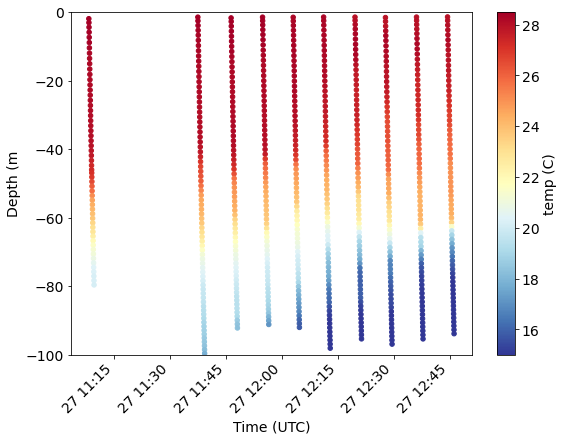

In [217]:
dates, interpolated_grids = interpolate_profiles(profiles, profile_transect_names[2], [data_variables[0]], plot=True)

## Visualizing the subset of transects with potentially good radiometer data

In [218]:
plt.rcParams.update({'font.size': 14})

In [219]:
df = tsg_df

0


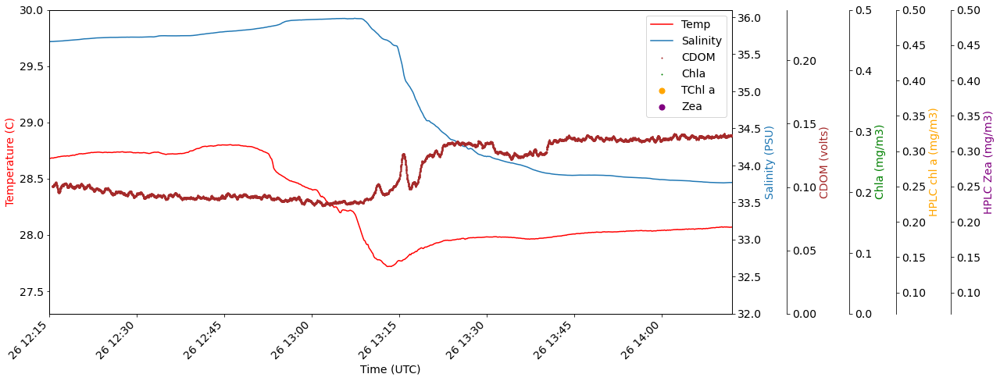

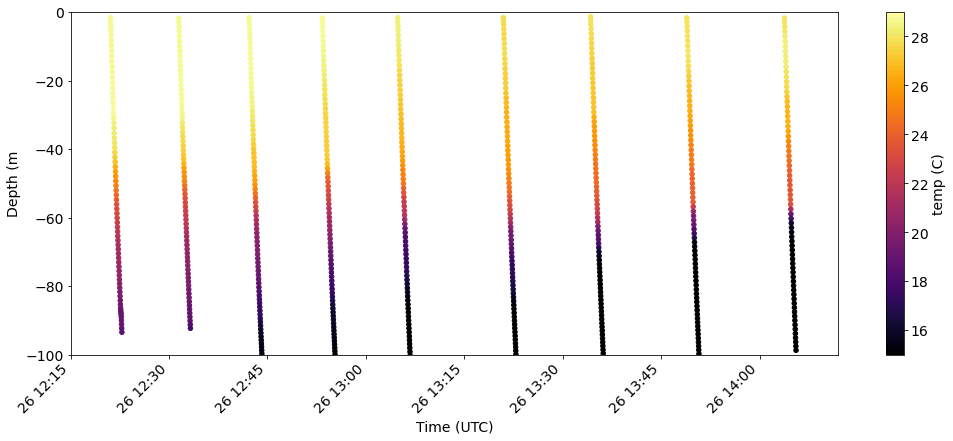

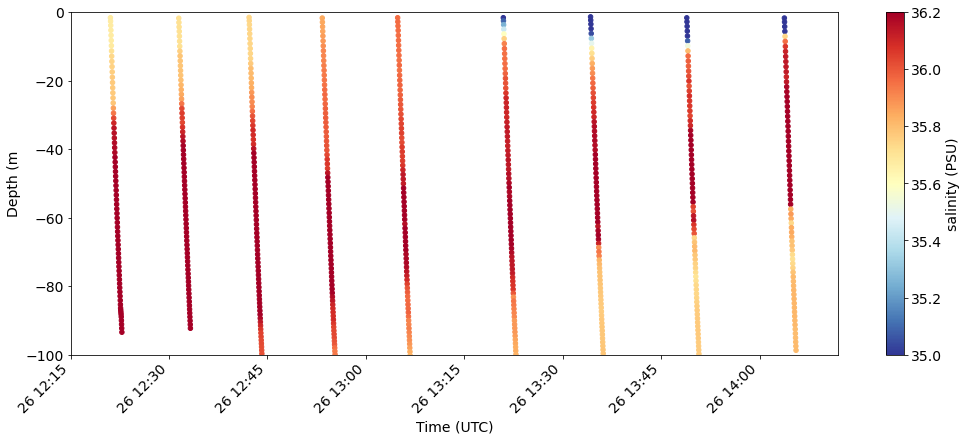

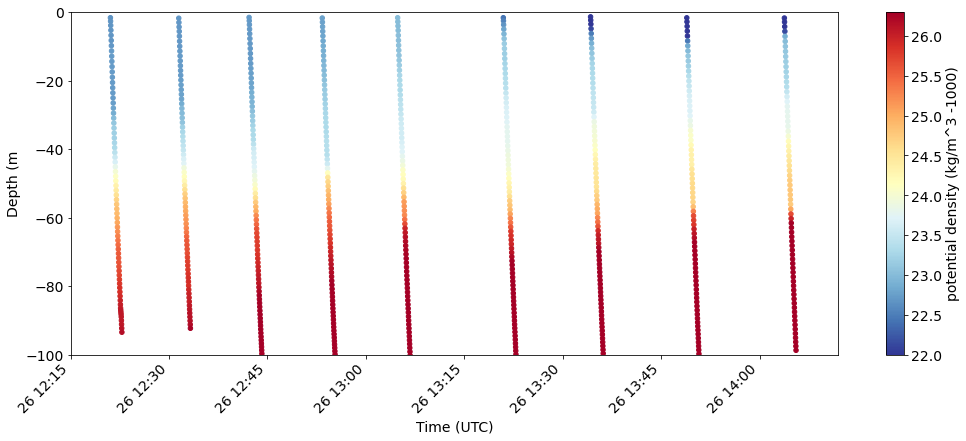

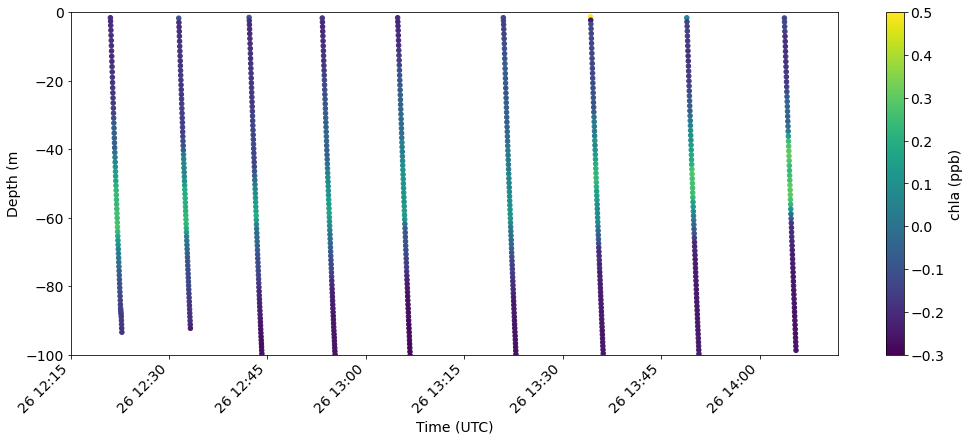

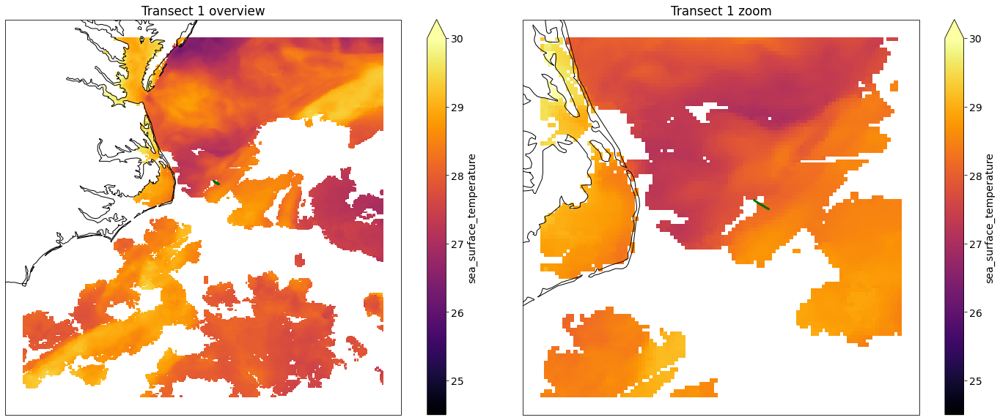

1


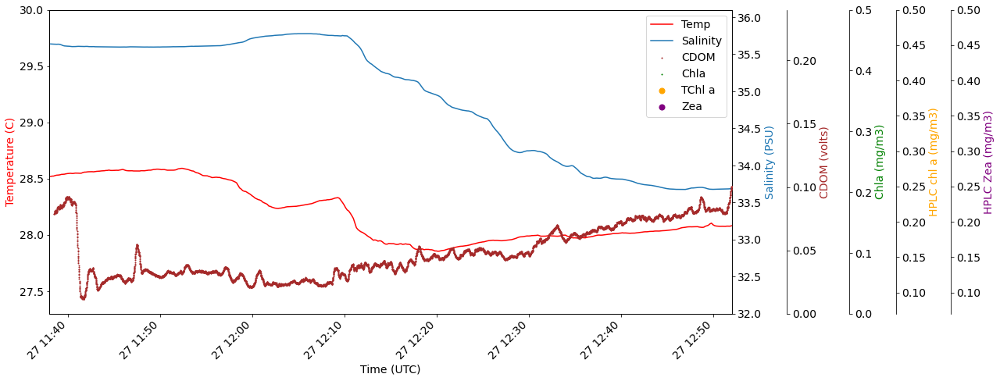

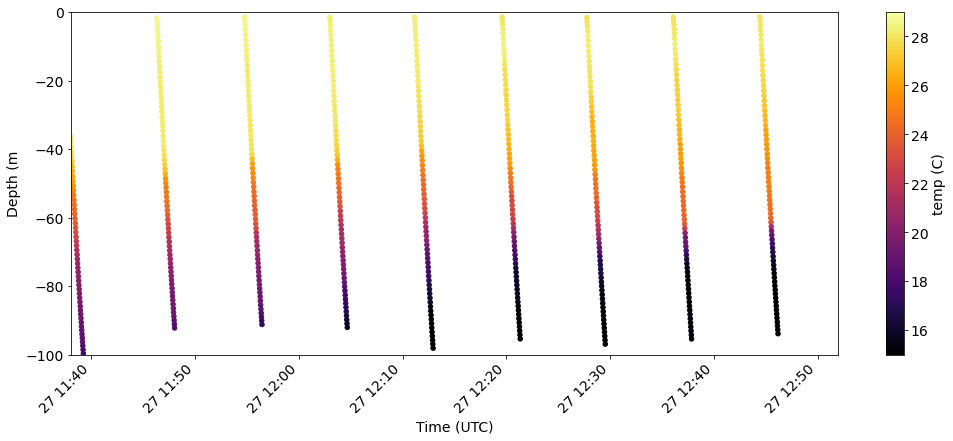

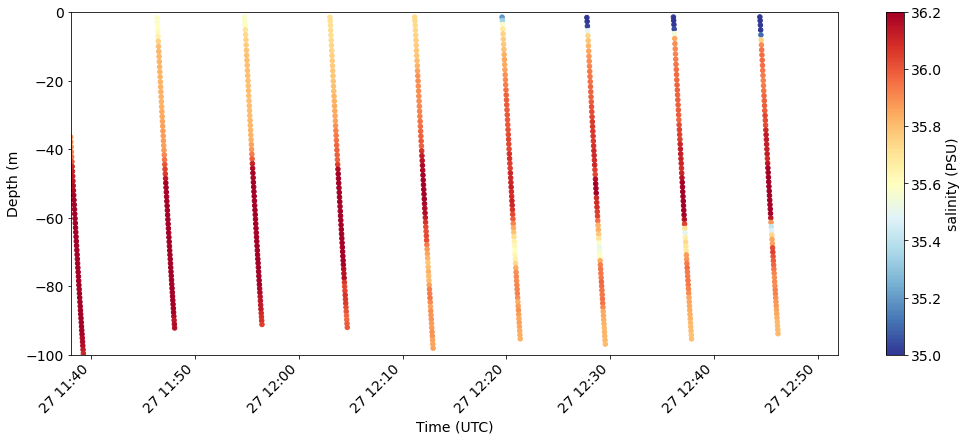

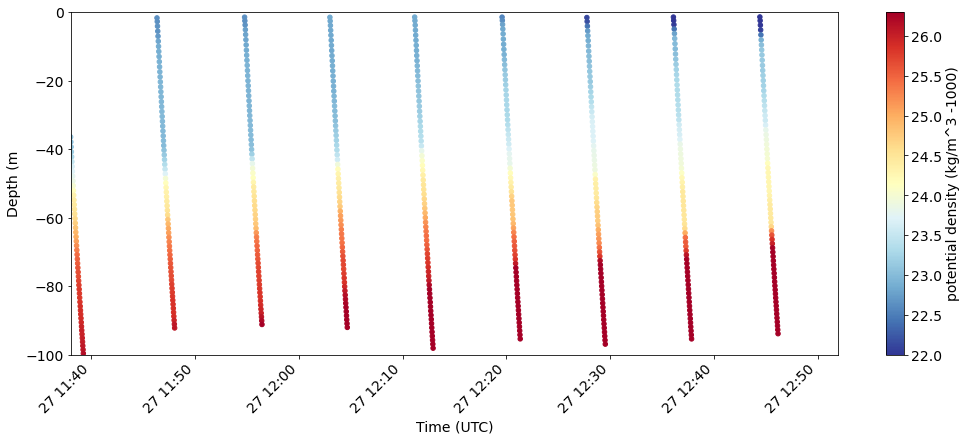

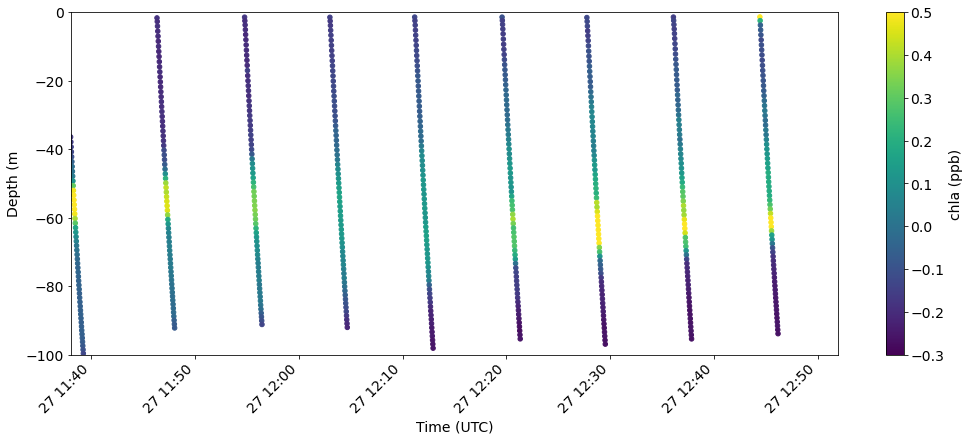

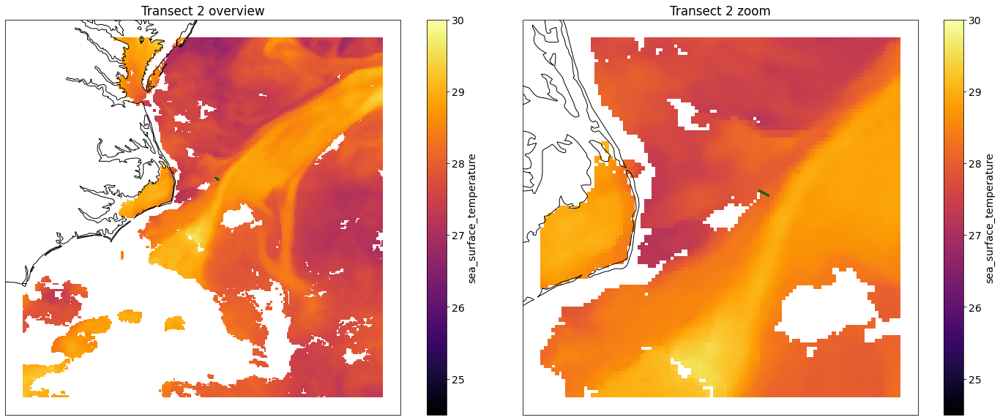

2


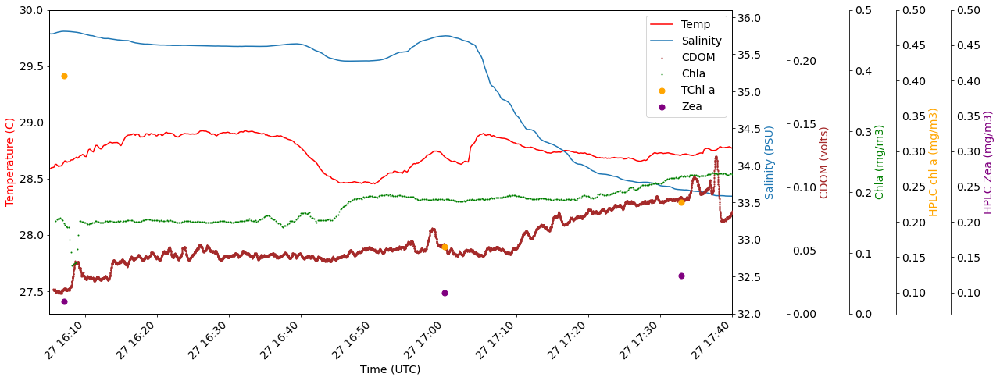

---no profile data this transect---


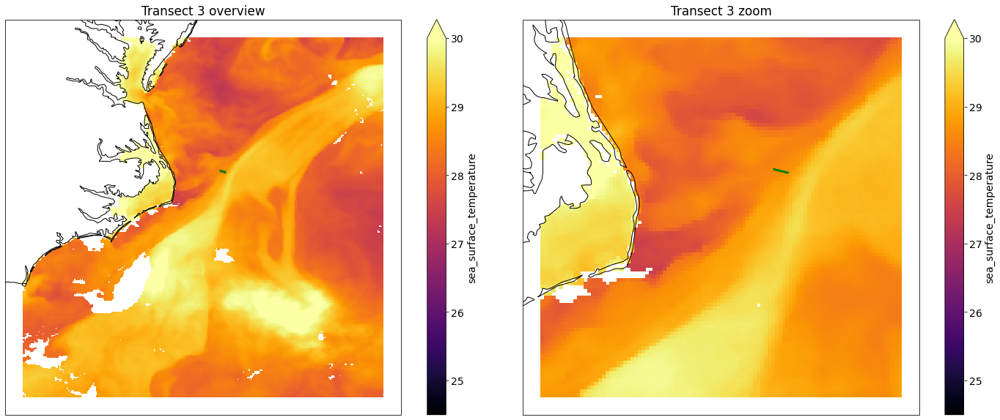

3


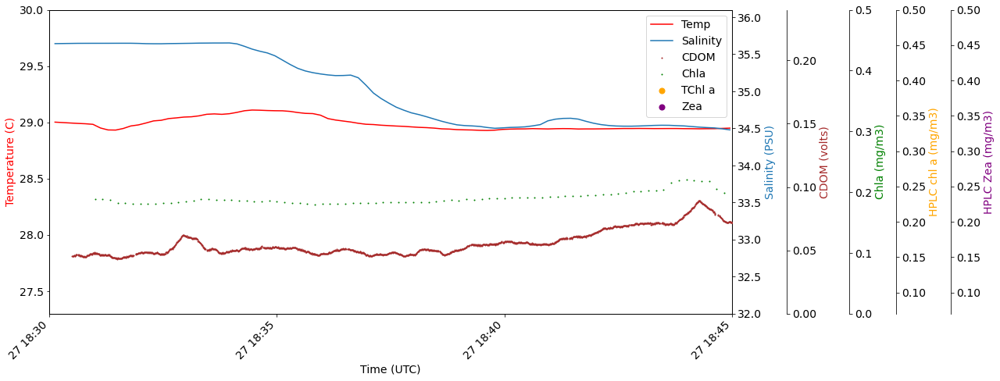

---no profile data this transect---


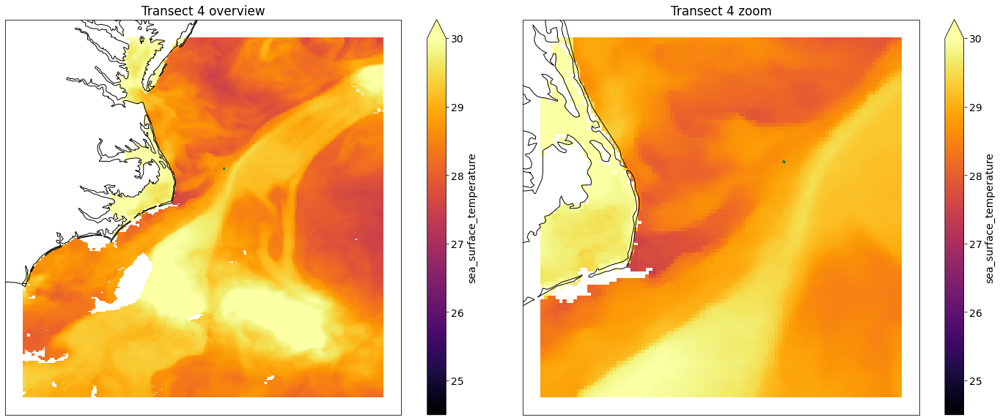

4


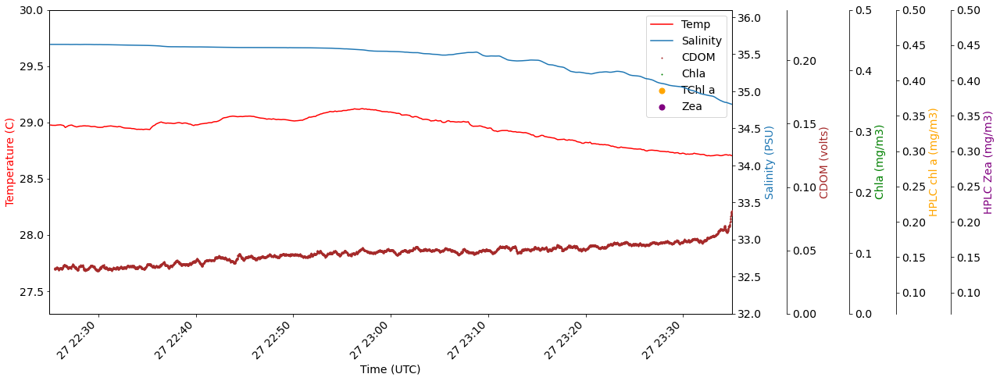

---no profile data this transect---


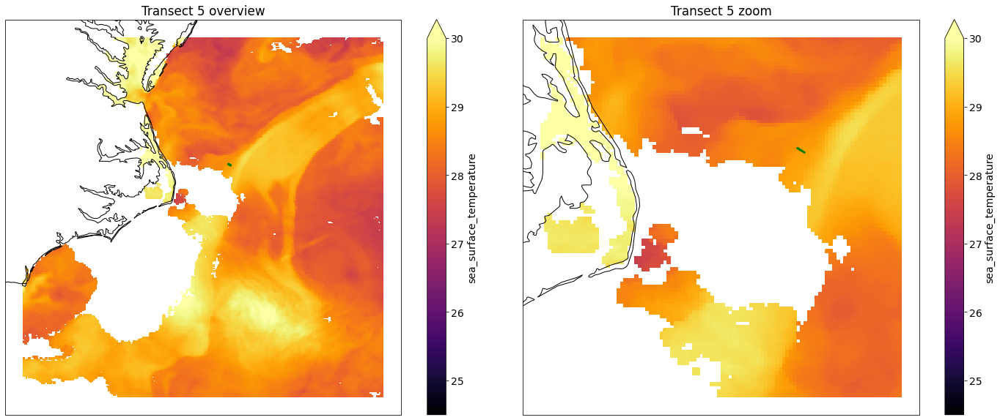

5


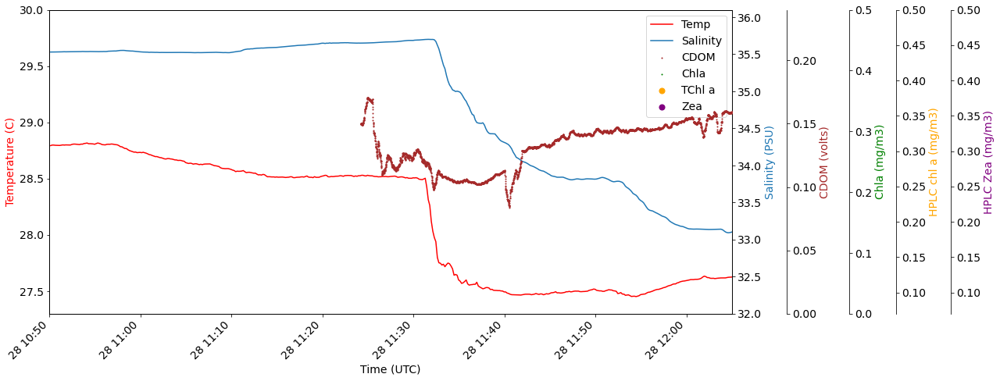

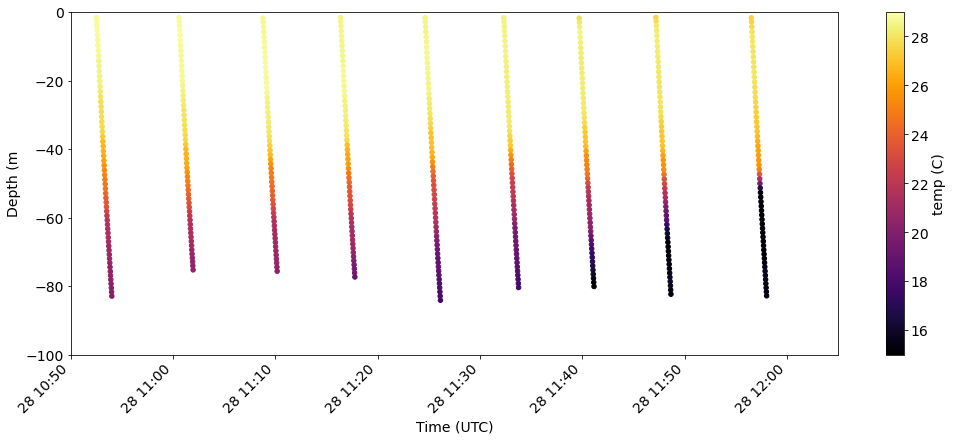

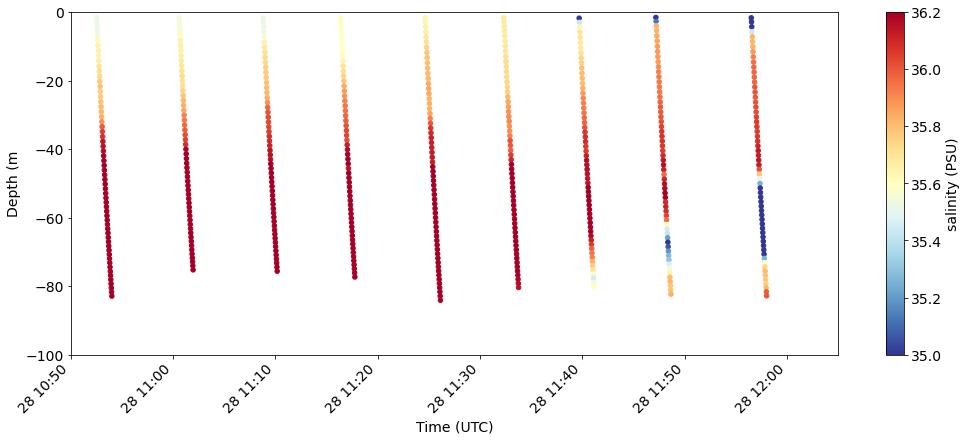

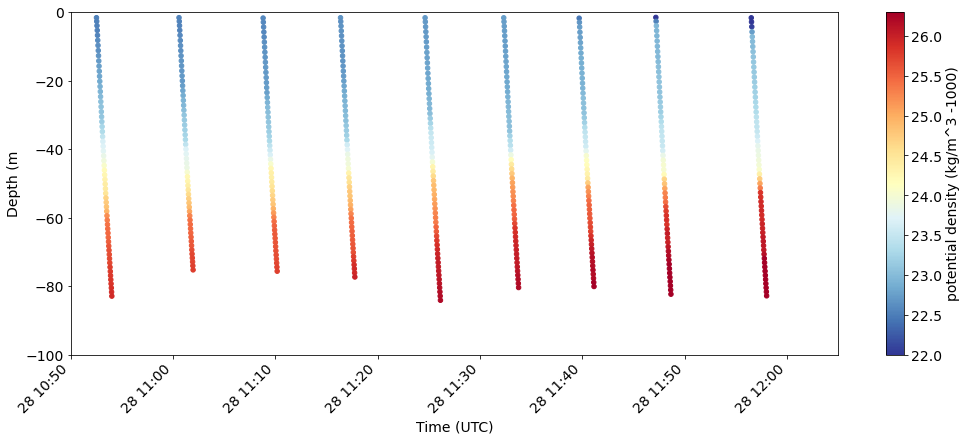

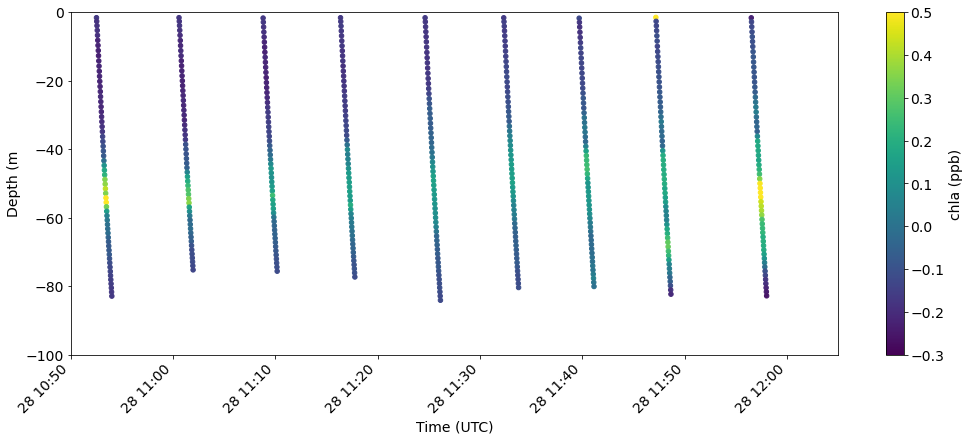

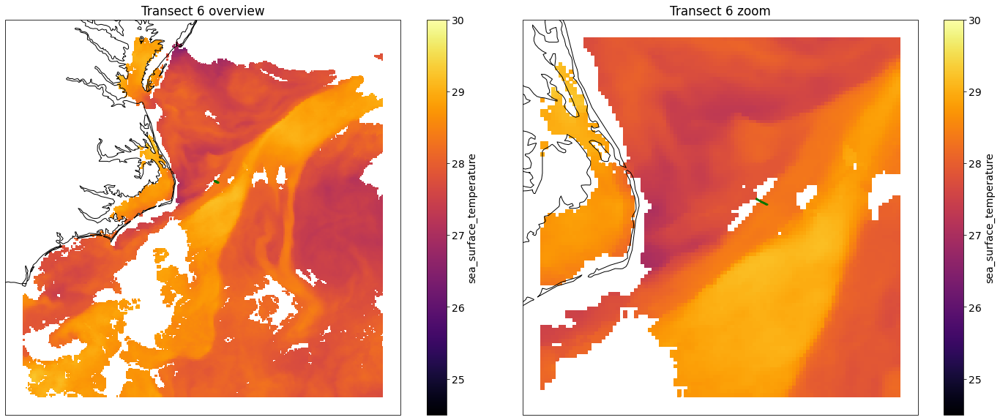

6


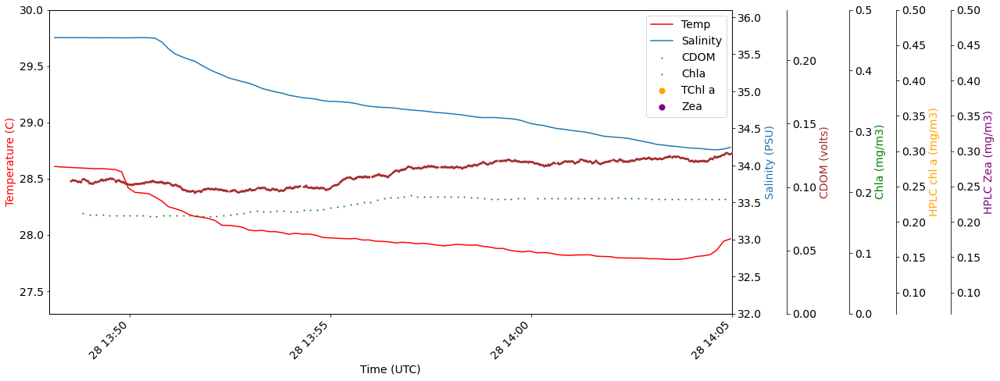

---no profile data this transect---


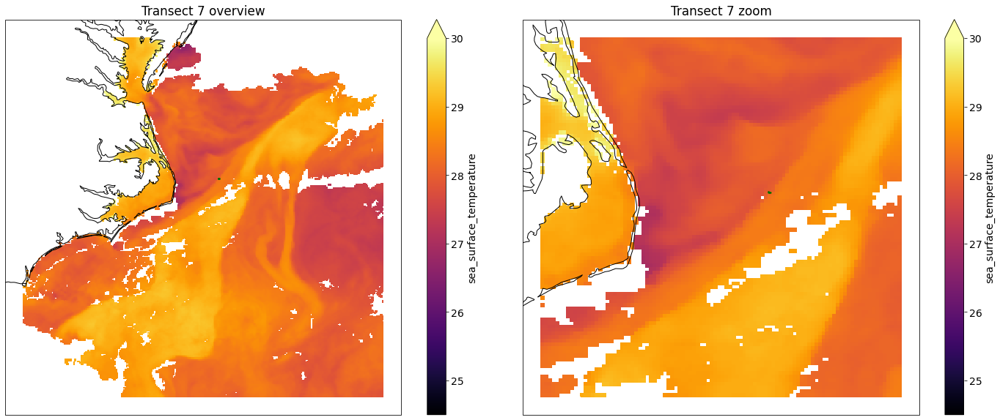

7


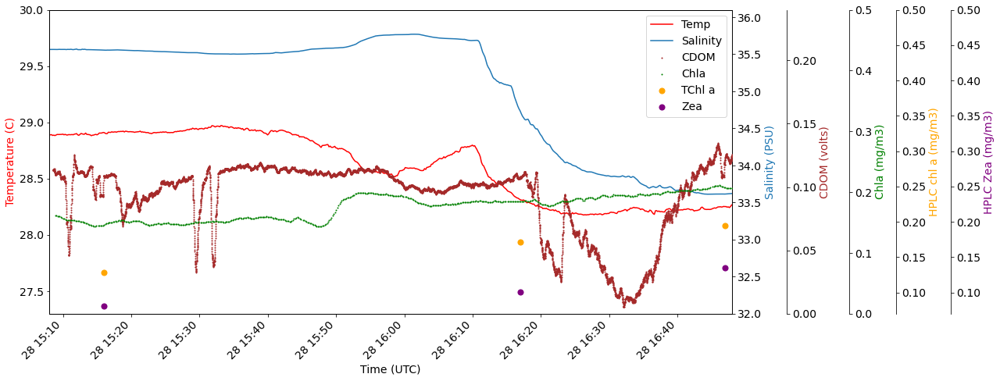

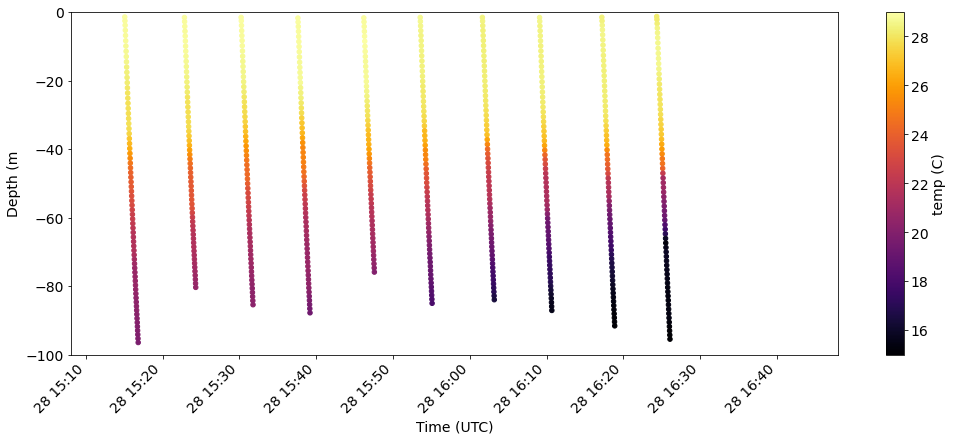

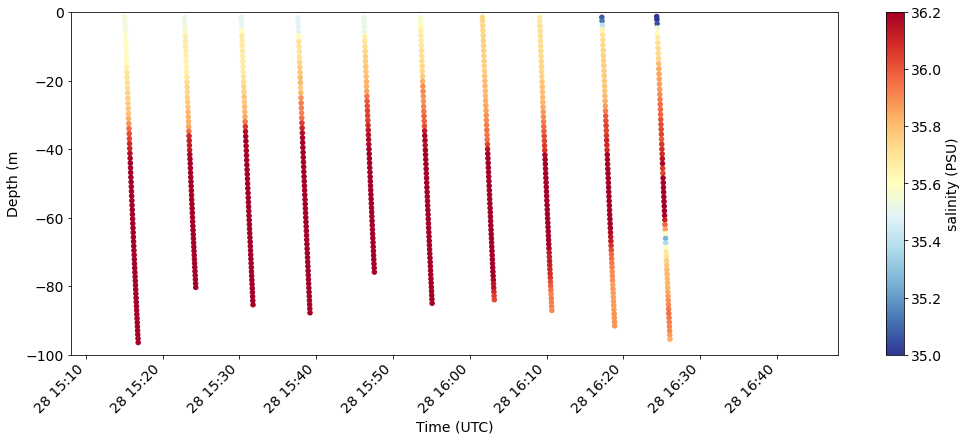

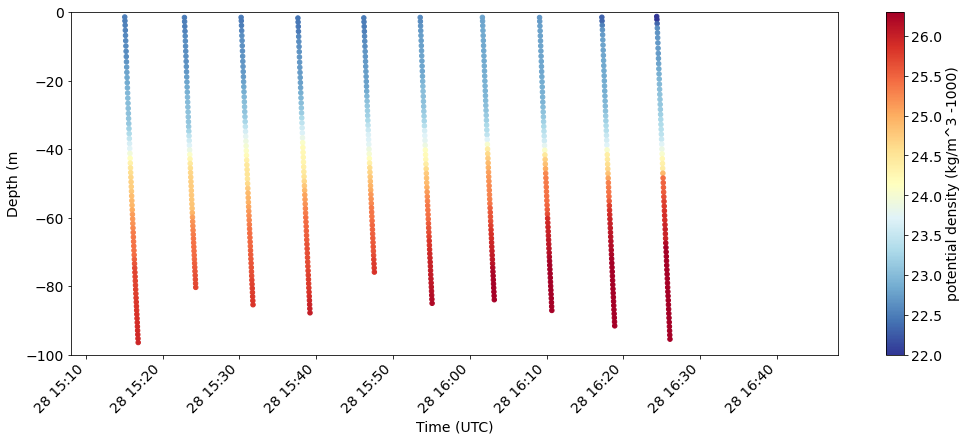

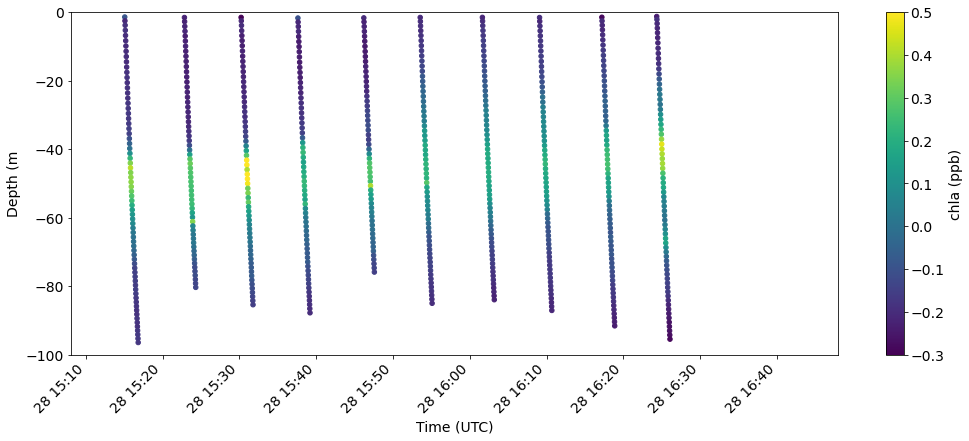

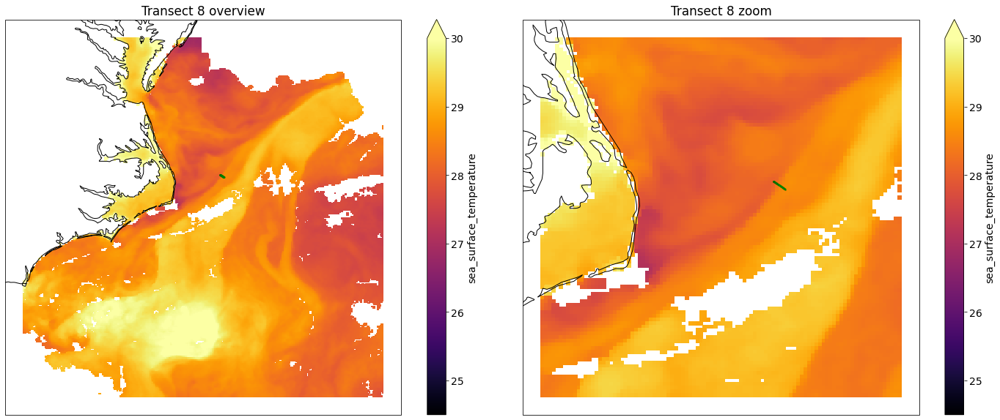

8


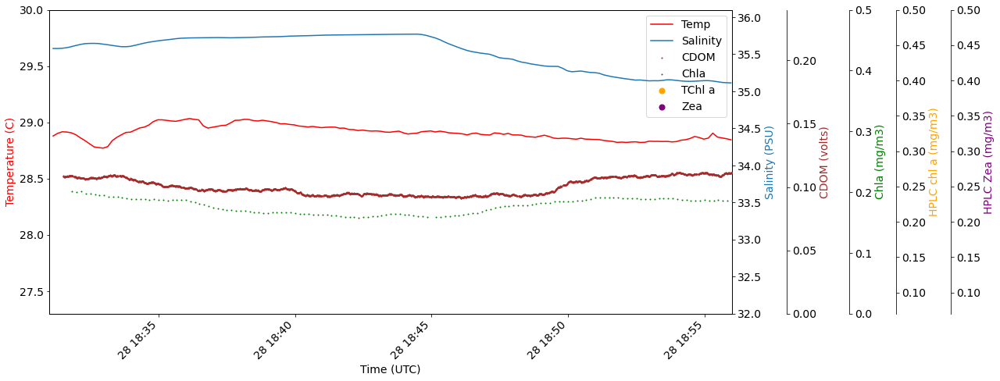

---no profile data this transect---


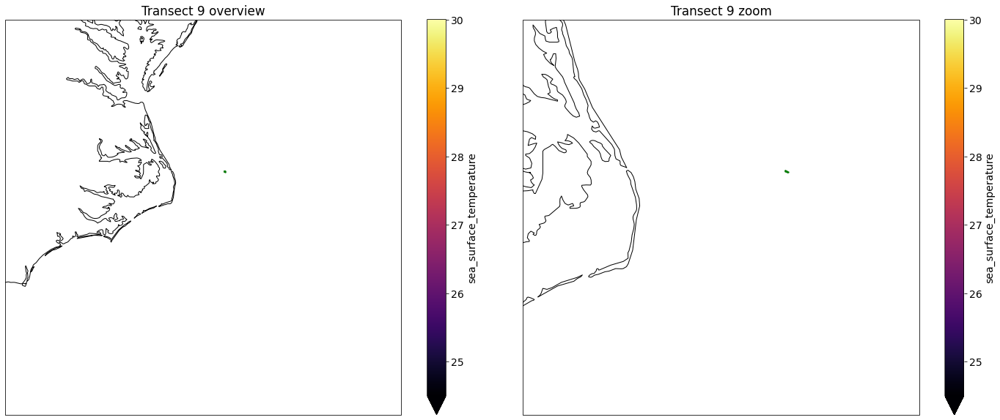

9


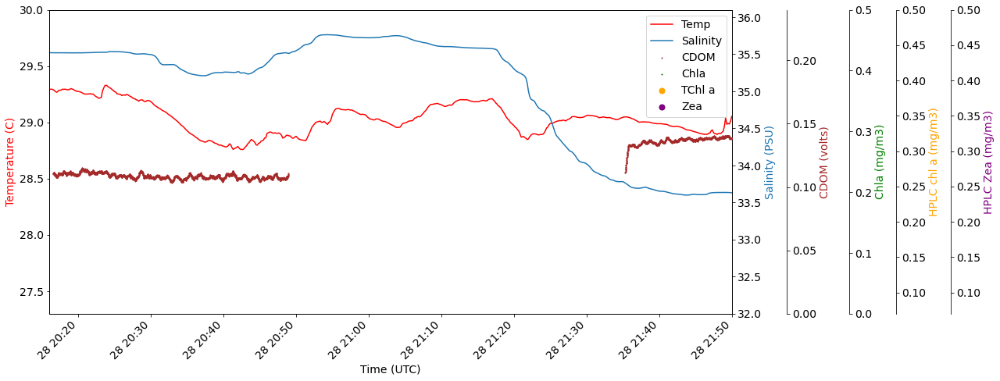

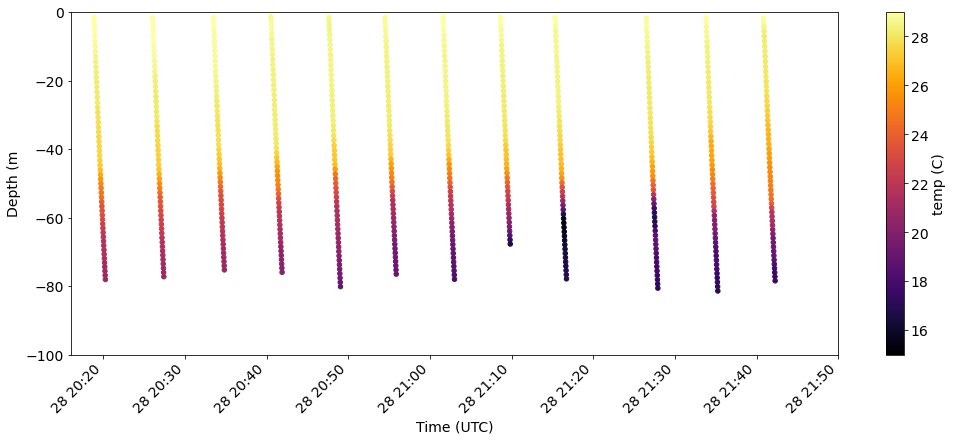

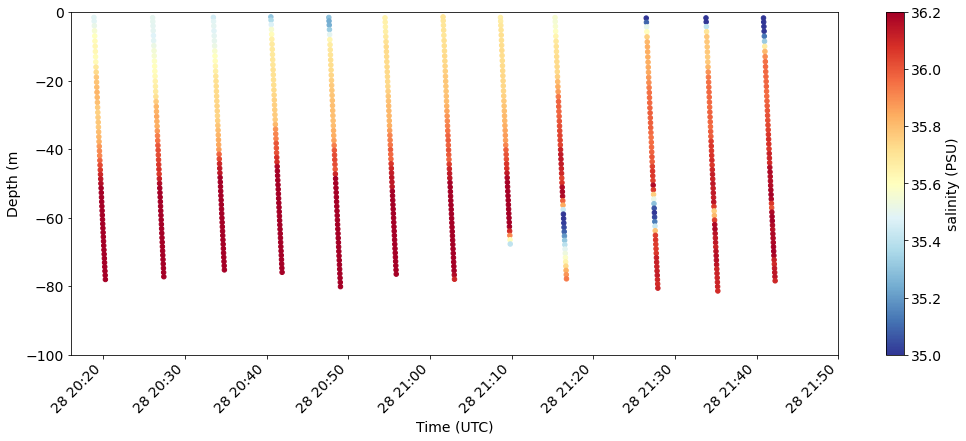

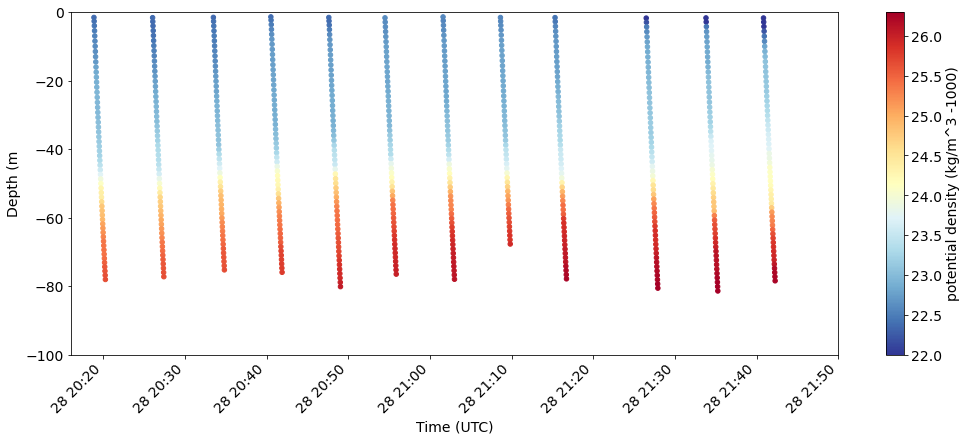

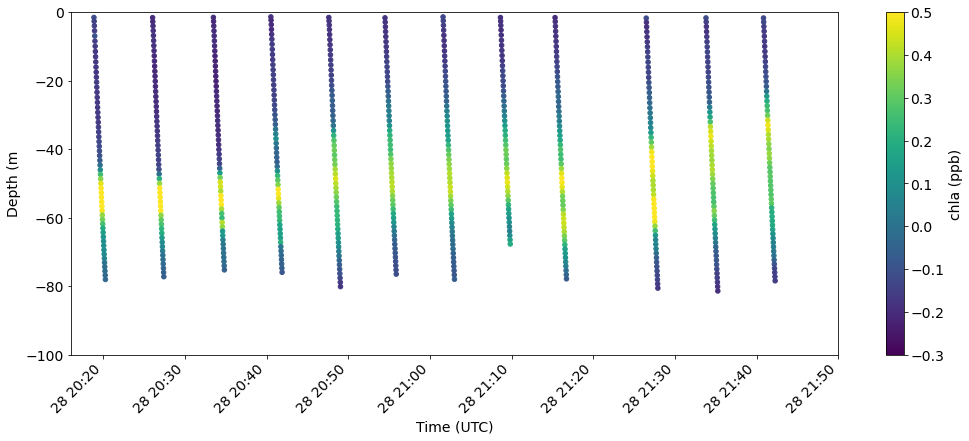

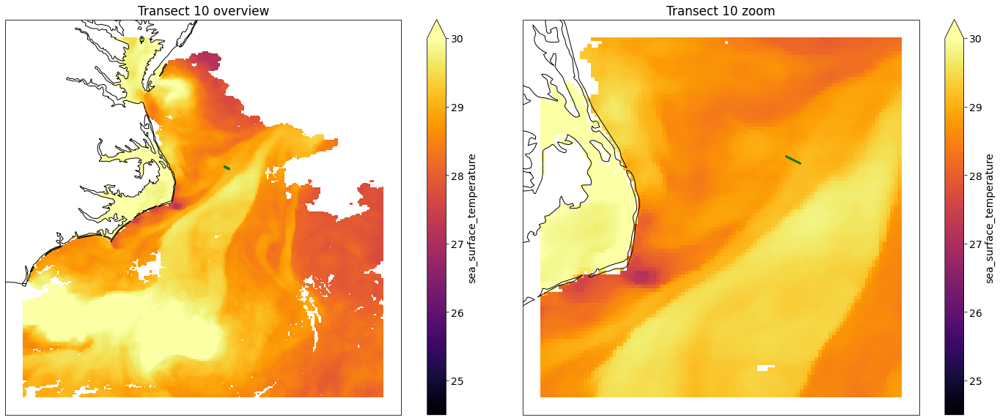

10


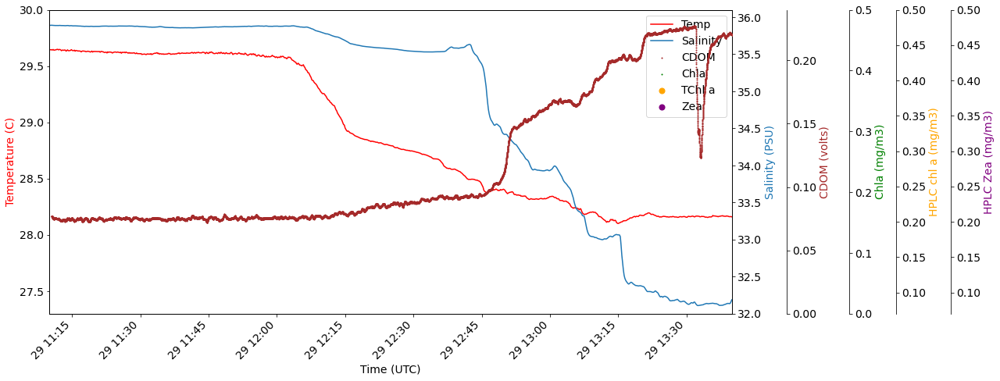

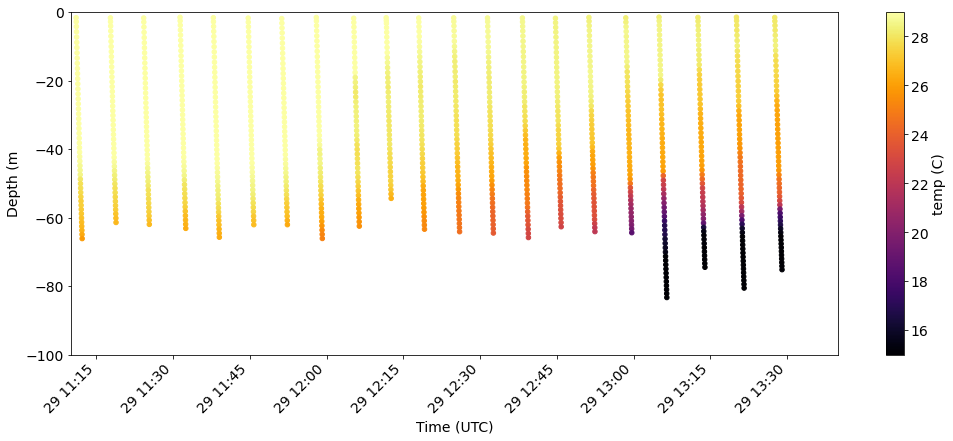

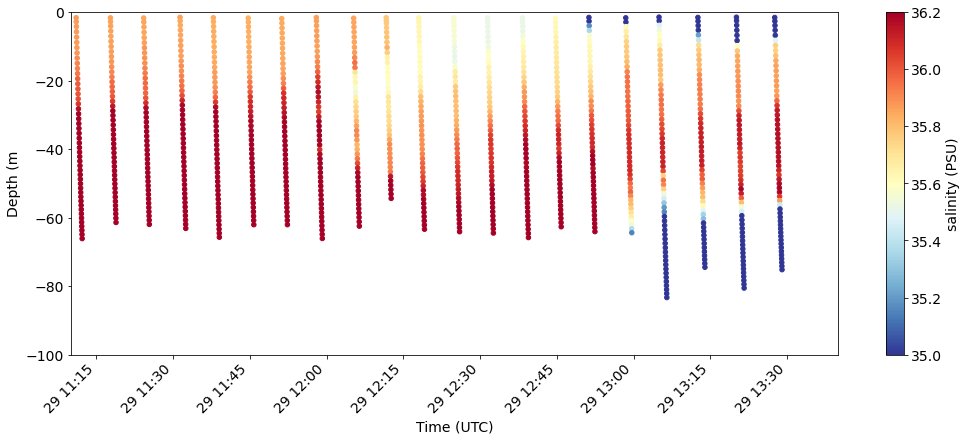

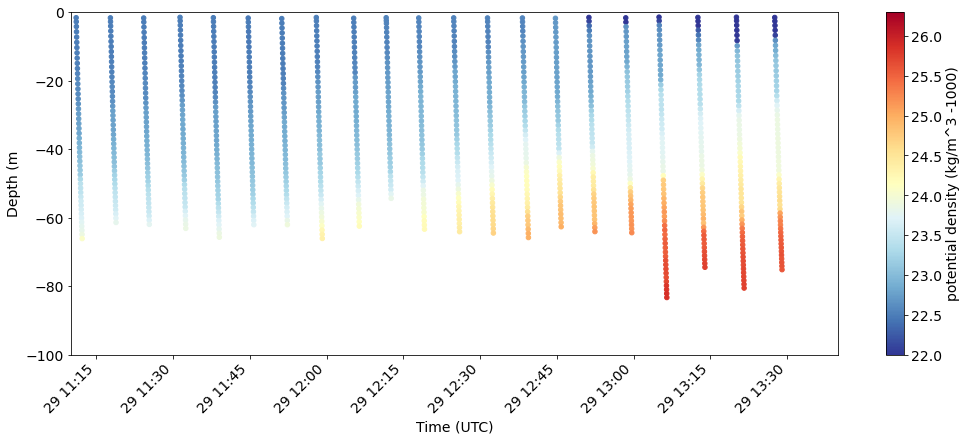

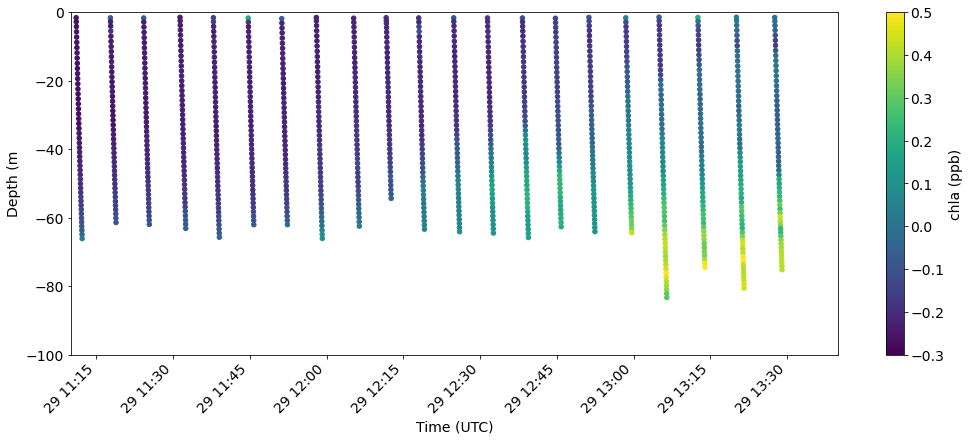

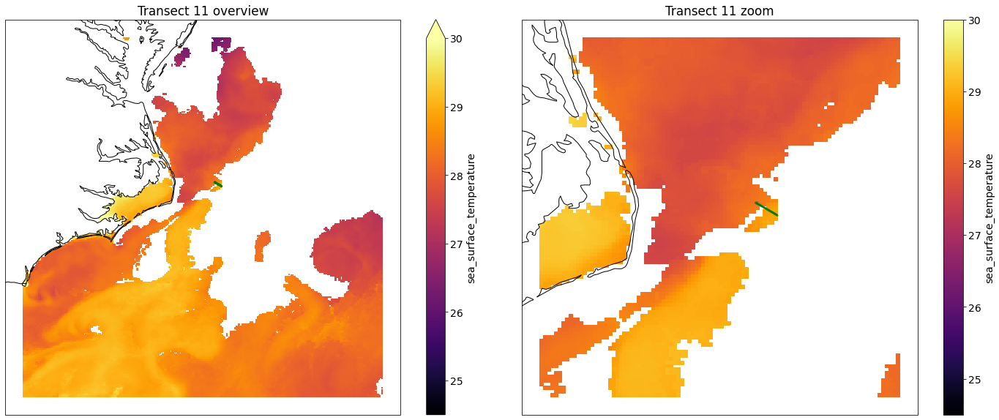

11


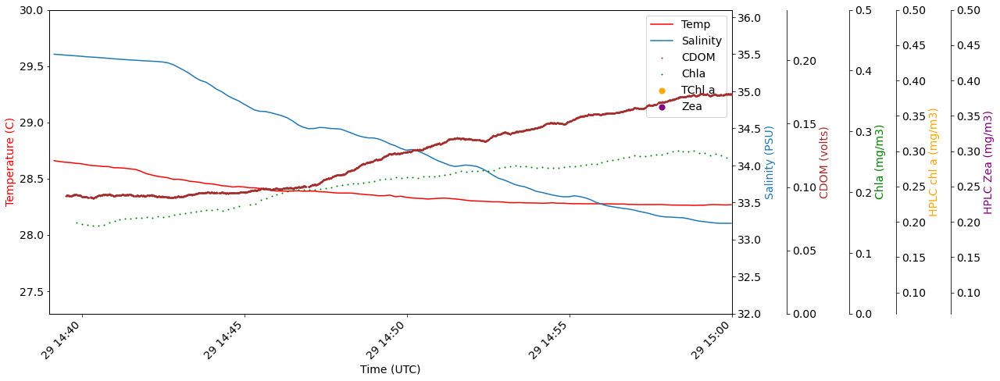

---no profile data this transect---


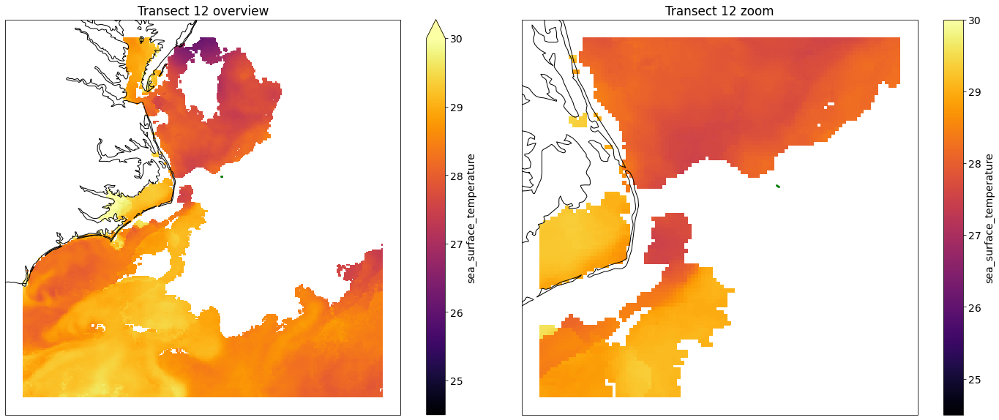

12


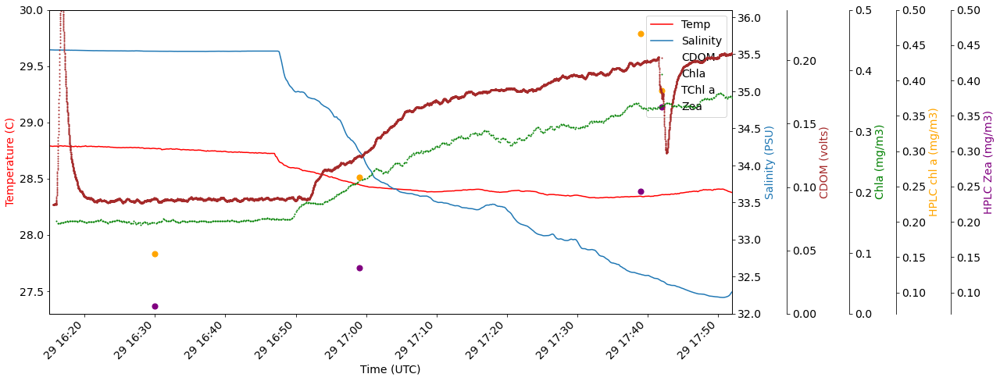

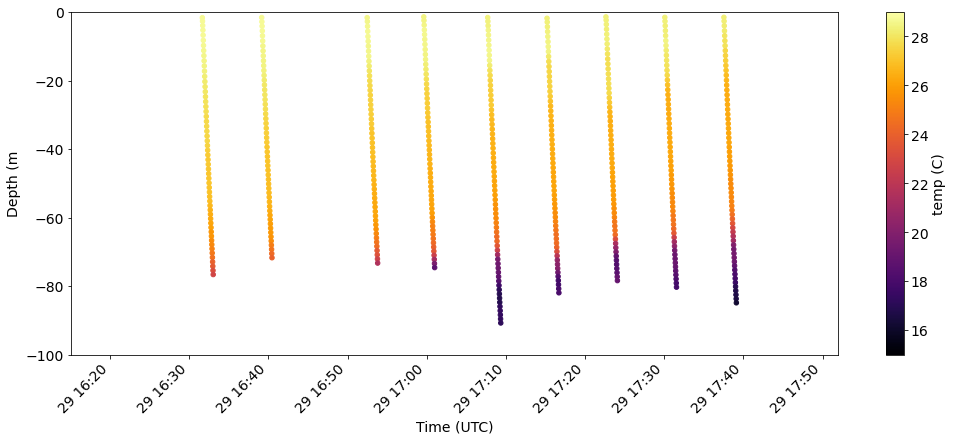

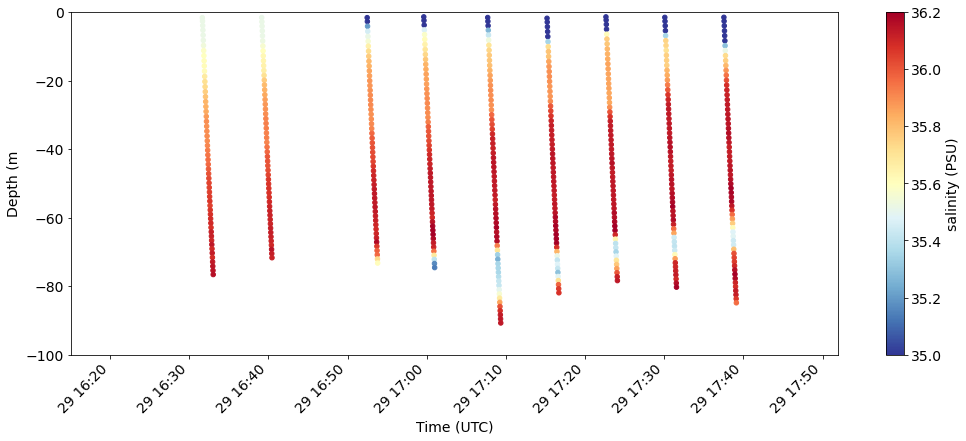

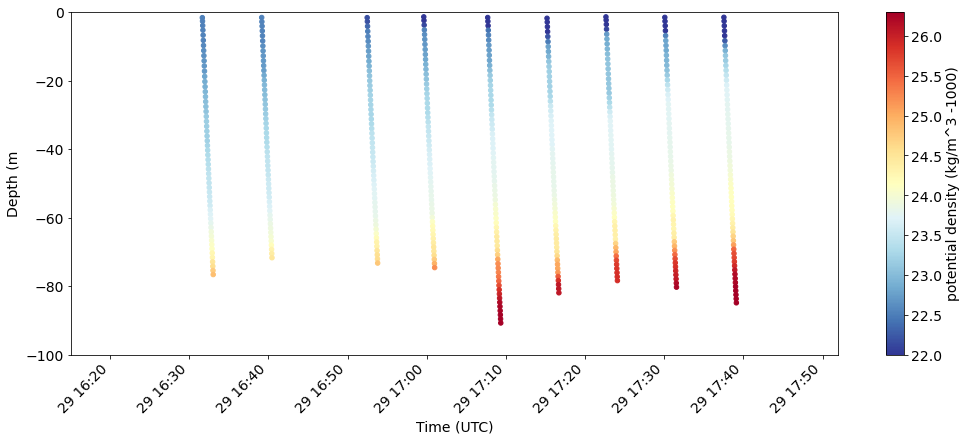

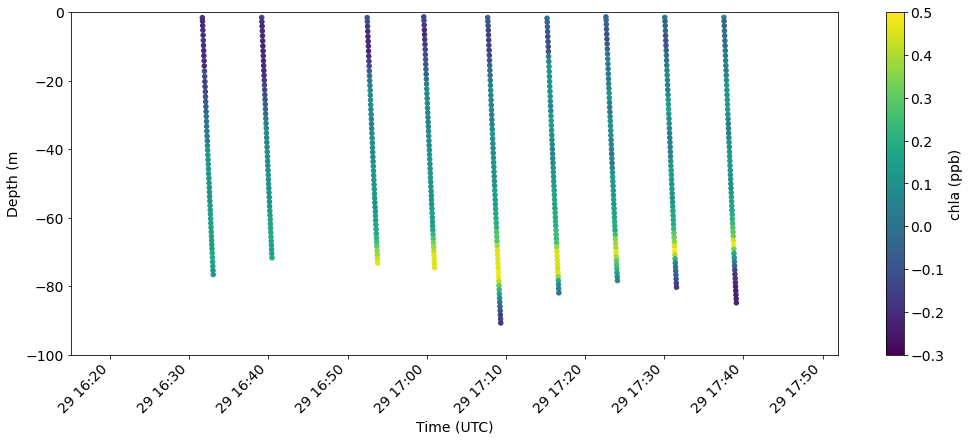

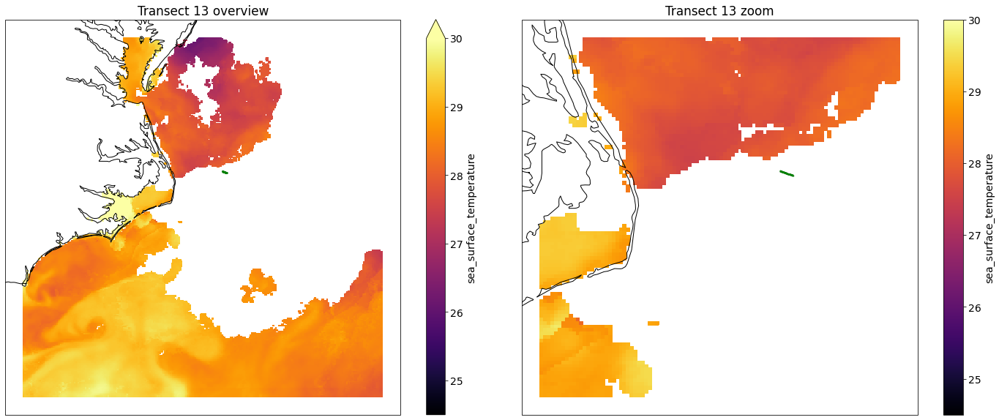

In [223]:
hours = [0,0,0,1,0,0,0,0,0,0,4,4,4]

titles = ['Transect 1', 'Transect 2', 'Transect 3', 'Transect 4', 
        'Transect 5', 'Transect 6', 'Transect 7', 'Transect 8',
        'Transect 9', 'Transect 10', 'Transect 11', 'Transect 12', 'Transect 13']

for i in range(13):
#     if trios_df.loc[start_times[i]:end_times[i]]['chla_oci'].empty:
#         pass
# #     elif hplc_df.loc[start_times[i]:end_times[i]]['datetime'].empty:
# #         pass
#     else:
        print(i)

        # time series plot
        fig, ax = plt.subplots(figsize=(18,7))
        
        ax.set_xlim(pd.to_datetime(start_times[i]), pd.to_datetime(end_times[i]))

        ax1 = ax.twinx()
        ax2 = ax.twinx()
        ax3 = ax.twinx()
        ax4 = ax.twinx()
        ax5 = ax.twinx()

        ax.set_ylim(27.3, 30)
        ax1.set_ylim(32, 36.1)
        ax2.set_ylim(.0, .24)
        ax3.set_ylim(.0, .50)
        ax4.set_ylim(.07, .50)
        ax5.set_ylim(.07, .50)

        ax.set_xlabel("Time (UTC)")
        ax.set_ylabel("Temperature (C)")
        ax1.set_ylabel("Salinity (PSU)")
        ax2.set_ylabel("CDOM (volts)")
        ax3.set_ylabel("Chla (mg/m3)")
        ax4.set_ylabel("HPLC chl a (mg/m3)")
        ax5.set_ylabel("HPLC Zea (mg/m3)")
        
        color1 = plt.cm.viridis(0)
        color2 = plt.cm.viridis(0.5)
        color3 = plt.cm.viridis(.9)

        p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['Temp'], color='red', label='Temp')
        p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['Sal'], label='Salinity')
        
        
        if cdom_df.loc[start_times[i]:end_times[i]].rolling(window=6*10).mean()['cdom_volts'].empty:
            cdom_data_x = None
            cdom_data_y = None
        else:
            cdom_data_x = cdom_df.loc[start_times[i]:end_times[i]].index, 
            cdom_data_y = cdom_df.loc[start_times[i]:end_times[i]].rolling(window=60).mean()['cdom_volts']
        p3  = ax2.scatter(cdom_data_x, cdom_data_y, color='brown', label='CDOM', s=1)
        
        trios_data_x = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean().index
        trios_data_y = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean()['chla_oci']
        p4  = ax3.scatter(trios_data_x, trios_data_y, color='green', label='Chla', s=1)
        
        p5 = ax4.scatter(hplc_df.loc[start_times[i]:end_times[i]].index, hplc_df.loc[start_times[i]:end_times[i]]['[TChl a]'], 
                   color='orange', label='TChl a', s=50)
        p6 = ax5.scatter(hplc_df.loc[start_times[i]:end_times[i]].index, hplc_df.loc[start_times[i]:end_times[i]]['[Zea]'], 
                   color='purple', label='Zea', s=50)

#         ax.set_title(titles[i])


    #     p1, = ax.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Density")
    #     p2, = ax1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="Temperature")
    #     p3, = ax2.plot([0, 1, 2], [50, 30, 15], color=color3, label="Velocity")

        lns = [p1, p2, p3, p4, p5, p6]
        ax.legend(handles=lns, loc='upper right')

        # right, left, top, bottom
        ax2.spines['right'].set_position(('outward', 70))

        ax3.spines['right'].set_position(('outward', 150))
        
        ax4.spines['right'].set_position(('outward', 210))
        
        ax5.spines['right'].set_position(('outward', 280))

        # no x-ticks                 
    #     ax2.xaxis.set_ticks([])
        fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')

        ax.yaxis.label.set_color(p1.get_color())
        ax1.yaxis.label.set_color(p2.get_color())
        ax2.yaxis.label.set_color('brown')
        ax3.yaxis.label.set_color('green')
        ax4.yaxis.label.set_color('orange')
        ax5.yaxis.label.set_color('purple')

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
#         fig.savefig('figs/'+titles[i] +'.png')
    #     plt.close()
        plt.show()
        
        # plot profile data if it exists
        
        if profiles.loc[start_times[i]:end_times[i]].empty:
            print('---no profile data this transect---')
        else:
            plot_profiles(profiles, start_times[i],end_times[i], ['temp (C)','salinity (PSU)','potential density (kg/m^3 -1000)', 'chla (ppb)'], 
                          plot=True)
        

        # SST image

        fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
        ax[0].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)

        ax[1].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
        # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
        ax[0].set_title(titles[i] + ' overview')
        ax[1].set_title(titles[i] + ' zoom')
        fig.tight_layout()
    #     fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()
        plt.show()    

        # fig.savefig('transect' + str(i) '_s_t.png')

KeyError: 'TSG--temp-SBE38'

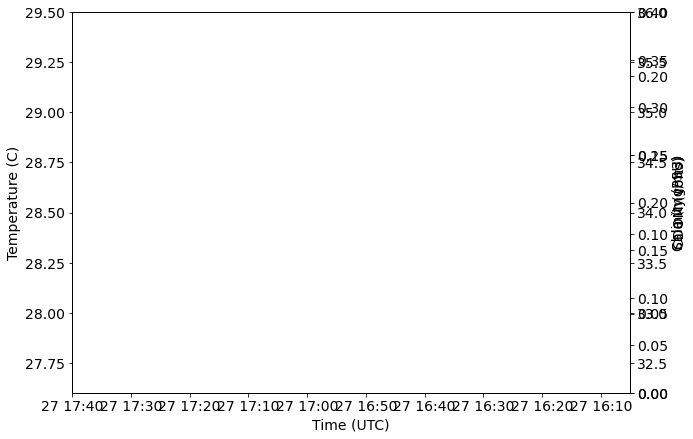

In [108]:
hours = [0,0,0,1,0,0,0,0,0,0,4,4,4]

titles = ['Transect 1', 'Transect 2', 'Transect 3', 'Transect 4', 
        'Transect 5', 'Transect 6', 'Transect 7', 'Transect 8',
        'Transect 9', 'Transect 10', 'Transect 11', 'Transect 12', 'Transect 13']

for i in range(13):
    if trios_df.loc[start_times[i]:end_times[i]]['chla_oci'].empty:
        pass
    elif hplc_df.loc[start_times[i]:end_times[i]]['datetime'].empty:
        pass
    else:
        # time series plot
        fig, ax = plt.subplots(figsize=(10,7))
        
        ax.set_xlim(pd.to_datetime(end_times[i]),pd.to_datetime(start_times[i]))

        ax1 = ax.twinx()
        ax2 = ax.twinx()
        ax3 = ax.twinx()

        ax.set_ylim(27.6, 29.5)
        ax1.set_ylim(32.2, 36)
        ax2.set_ylim(.0, .24)
        ax3.set_ylim(.0, .40)

        ax.set_xlabel("Time (UTC)")
        ax.set_ylabel("Temperature (C)")
        ax1.set_ylabel("Salinity (PSU)")
        ax2.set_ylabel("CDOM (volts)")
        ax3.set_ylabel("Chla (mg/m3)")

        color1 = plt.cm.viridis(0)
        color2 = plt.cm.viridis(0.5)
        color3 = plt.cm.viridis(.9)

        p1, = ax.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--temp-SBE38'], color='red', label='Temp')
        p2, = ax1.plot(df.loc[start_times[i]:end_times[i]].index, df.loc[start_times[i]:end_times[i]]['TSG--sal'], label='Salinity')
                
#         if hplc_df.loc[start_times[i]:end_times[i]]['datetime'].empty:
#             hplc_data_x = None
#             hplc_data_y = None
#         else:
#             hplc_data_x = hplc_df.loc[pd.to_datetime(start_times[i]) - timedelta(minutes=15):pd.to_datetime(end_times[i]) + timedelta(minutes=15)].index, 
#             hplc_data_y = [28.4]*len(hplc_df.loc[pd.to_datetime(start_times[i]) - timedelta(minutes=15):pd.to_datetime(end_times[i]) + timedelta(minutes=15)])
# #             print(hplc_df.loc[pd.to_datetime(start_times[i]) - timedelta(minutes=15):pd.to_datetime(end_times[i]) + timedelta(minutes=15)].Sample)
#         ax.scatter(hplc_data_x, hplc_data_y, color='orange', label='HPLC', s=100)
        
        if cdom_df.loc[start_times[i]:end_times[i]].rolling(window=6*10).mean()['cdom_volts'].empty:
            cdom_data_x = None
            cdom_data_y = None
        else:
            cdom_data_x = cdom_df.loc[start_times[i]:end_times[i]].index, 
            cdom_data_y = cdom_df.loc[start_times[i]:end_times[i]].rolling(window=60).mean()['cdom_volts']
        p3  = ax2.scatter(cdom_data_x, cdom_data_y, color='brown', label='CDOM', s=1)
        
        trios_data_x = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean().index
        trios_data_y = trios_df.loc[start_times[i]:end_times[i]].rolling(window=6*1).mean()['chla_oci']
        p4  = ax3.scatter(trios_data_x, trios_data_y, color='green', label='Chla', s=1)

#         ax.set_title(titles[i])


    #     p1, = ax.plot([0, 1, 2], [0, 1, 2],    color=color1, label="Density")
    #     p2, = ax1.plot([0, 1, 2], [0, 3, 2],    color=color2, label="Temperature")
    #     p3, = ax2.plot([0, 1, 2], [50, 30, 15], color=color3, label="Velocity")

        lns = [p1, p2, p3, p4]
        ax.legend(handles=lns, loc='lower right')

        # right, left, top, bottom
        ax2.spines['right'].set_position(('outward', 70))

        ax3.spines['right'].set_position(('outward', 150))

        # no x-ticks                 
    #     ax2.xaxis.set_ticks([])
        fig.autofmt_xdate(rotation=45)

        # Sometimes handy, same for xaxis
        #par2.yaxis.set_ticks_position('right')

        # Move "Velocity"-axis to the left
        # par2.spines['left'].set_position(('outward', 60))
        # par2.spines['left'].set_visible(True)
        # par2.yaxis.set_label_position('left')
        # par2.yaxis.set_ticks_position('left')

        ax.yaxis.label.set_color(p1.get_color())
        ax1.yaxis.label.set_color(p2.get_color())
        ax2.yaxis.label.set_color('brown')
        ax3.yaxis.label.set_color('green')

        # Adjust spacings w.r.t. figsize
        fig.tight_layout()
#         fig.savefig('figs/'+titles[i] +'.png')
    #     plt.close()
        plt.show()
        
        # cluster and T-S diagram
        
        trios_subset = trios_gdf.loc[start_times[i]:end_times[i]]
        # cutting off the parts most influenced by chla absorption
        kmeans = KMeans(n_clusters=3, random_state=0).fit(trios_subset.values[:,120:-315])
        
        fig, ax = plt.subplots(1,3, figsize=(22,6))
#         trios_subset.plot(ax=ax[0])
        
        trios_data_x = trios_subset.lon
        trios_data_y = trios_subset.lat
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=14), pd.to_datetime(end_times[i])-timedelta(hours=14))).sea_surface_temperature.mean(dim='time').plot(ax=ax[0], vmin=26.5, vmax=29.5, cmap='inferno', add_colorbar=False)

        ax[0].scatter(trios_data_x, trios_data_y, cmap='Set3', c=kmeans.labels_, label='cluster')
        
        
        ax[0].set_xlim(trios_data_x.min()-0.05, trios_data_x.max()+0.05)
        ax[0].set_ylim(trios_data_y.min()-0.05,trios_data_y.max()+0.05)

        # ss = ax.scatter(trios_gdf.lon, trios_gdf.lat, c=trios_gdf.chl, s=100)
        # fig.colorbar(sc,ax=ax)
        # fig.colorbar(sc, ax=ax)
        fig.autofmt_xdate(rotation=45)
        ax[0].set_title('Clusters')
        # fig.savefig('trios_radiometers_chlaci.png')
        
        ax[1].scatter(trios_subset['sal'], trios_subset['temp'], alpha=0.8, c=kmeans.labels_, cmap='Set3')
        ax[1].set_xlim(32,36)
        ax[1].set_ylim(28,29)

        ax[1].set_xlabel("Salinity")
        ax[1].set_ylabel("Temperature")
        
        sc = ax[2].scatter(trios_subset['sal'], trios_subset['temp'], alpha=0.8, c=trios_subset['chla_oci'], vmin=.12,vmax=.32, cmap='magma', label='chla')
        ax[2].set_xlim(32,36)
        ax[2].set_ylim(28,29)
        
        ax[2].set_xlabel("Salinity")
        ax[2].set_ylabel("Temperature")


        fig.colorbar(sc)
#         fig.savefig('aug_clusters_t_s_trios'+titles[i]+'.png')
        plt.show()
        
        x = trios_subset.values[:,120:-315]
#         x = x[12:,:]
        # Standardizing the features
        x = StandardScaler().fit_transform(x)
        pca = PCA(n_components=2)
        principalComponents = pca.fit_transform(x)

        fig, ax = plt.subplots(1,2, figsize=(20,9))
        sc = ax[1].scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_subset['chla_oci'], vmin=.12,vmax=.32, cmap='viridis', label='chla')
        fig.colorbar(sc)
        ax[1].set_ylim(-25,25)
        ax[1].set_xlim(-25,25)
        ax[0].scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=kmeans.labels_, cmap='Set3')
        ax[0].set_ylim(-25,25)
        ax[0].set_xlim(-25,25)
        
        fig.savefig('aug_pca_t_s_trios'+titles[i]+'.png')
        
        plt.show()
        # ax.set_ylim(-3,2)
        # ax.set_xlim(-6,8)
        # fig.savefig('pca_transect.png')



        # SST image

        fig, ax = plt.subplots(1,2, figsize=(20,8), subplot_kw=dict(projection=crs.PlateCarree()))
        ax[0].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,:,:].mean(dim='time').plot(ax=ax[0], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[0], markersize=2, color='green', alpha=.05)

        ax[1].coastlines(resolution='10m')
        goes_ds.sel(time=slice(pd.to_datetime(start_times[i])-timedelta(hours=hours[i]), pd.to_datetime(end_times[i])+timedelta(hours=hours[i]))).sea_surface_temperature[:,75:175, 100:200].mean(dim='time').plot(ax=ax[1], vmin=24.5, vmax=30, cmap='inferno')
        gdf.loc[start_times[i]:end_times[i]].plot(ax=ax[1], markersize=2, color='green', alpha=.05)
        # fig.savefig('sst_sept0523_studypoints.png',dpi=400)
        ax[0].set_title(titles[i] + ' overview')
        ax[1].set_title(titles[i] + ' zoom')
        fig.tight_layout()
    #     fig.savefig('figs/'+titles[i] +'sat_overview.png')
    #     plt.close()
        plt.show()    

        # fig.savefig('transect' + str(i) '_s_t.png')

## Quantify uncertainty in the trios instrument on the SW

In this section I try to quantify uncertainty in the method by using a period where we didn't move much and then propogate that error to the chla measurement.

In [47]:
static_trios_df = trios_df.loc['2021-08-26 19:46:00':'2021-08-26 19:55:00']
len(static_trios_df)

55

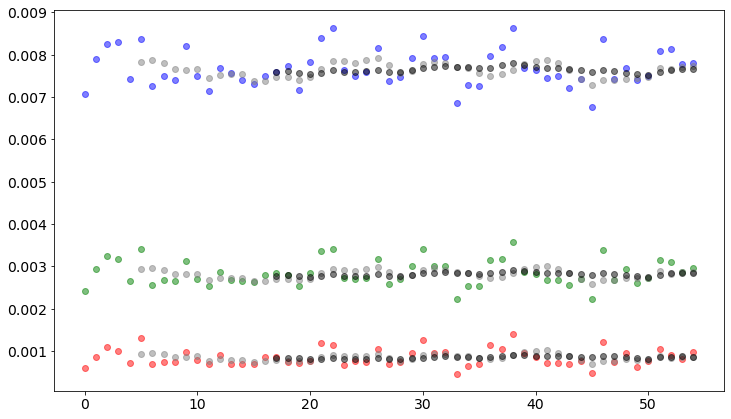

In [48]:
fig, ax = plt.subplots(figsize=(12,7))

for l,u,c in [[156,161,'blue'],[232,240,'green'],[346,351,'red']]:#,[232,240,'green'],[346,351,'red']]:
#     band_mean = static_trios_df.iloc[:, l:u].mean().mean()
#     band_std = static_trios_df.rolling(window=6*3).mean().iloc[:, l:u].mean(axis=1).std()
    
#     ax.axhline(band_mean,color=c)
#     ax.axhline(band_mean+band_std,color=c, ls='--')
#     ax.axhline(band_mean-band_std,color=c, ls='--')


    ax.scatter(range(len(static_trios_df)),static_trios_df.iloc[:, l:u].mean(axis=1),color=c, alpha=0.5)
    ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6).mean().iloc[:, l:u].mean(axis=1),color='grey', alpha=0.5)
    ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6*3).mean().iloc[:, l:u].mean(axis=1),color='black', alpha=0.5)
    
# ax.set_ylim(-0.001,0.004)
plt.show()

Text(0.5, 0, 'Repeated measurement count')

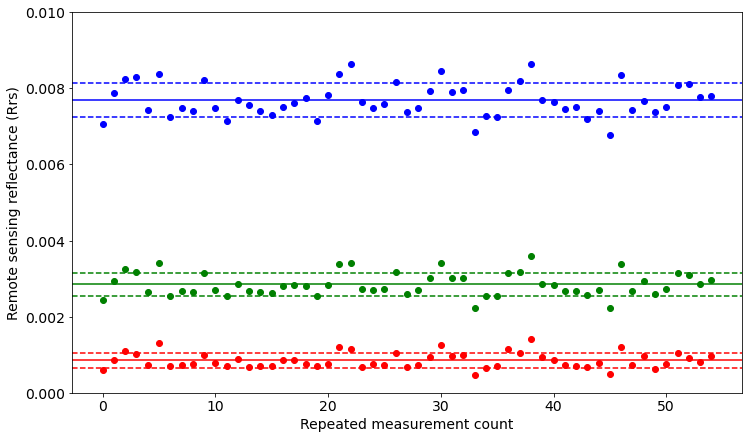

In [51]:
fig, ax = plt.subplots(figsize=(12,7))

for l,u,c in [[156,161,'blue'],[232,240,'green'],[346,351,'red']]:
    band_mean = static_trios_df.iloc[:, l:u].mean().mean()
    band_std = static_trios_df.iloc[:, l:u].mean(axis=1).std()
    
    
    ax.axhline(band_mean,color=c)
    ax.axhline(band_mean+band_std,color=c, ls='--')
    ax.axhline(band_mean-band_std,color=c, ls='--')


    ax.scatter(range(len(static_trios_df)),static_trios_df.iloc[:, l:u].mean(axis=1),color=c, alpha=1)
#     ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6).mean().iloc[:, l:u].mean(axis=1),color='silver', alpha=1)
#     ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6*3).mean().iloc[:, l:u].mean(axis=1),color='black', alpha=1)

ax.set_ylim(0,0.01)

ax.set_ylabel('Remote sensing reflectance (Rrs)')
ax.set_xlabel('Repeated measurement count')
# fig.savefig('repeated_measurements_trios.png',dpi=300)

Text(0.5, 0, 'Repeated measurement count')

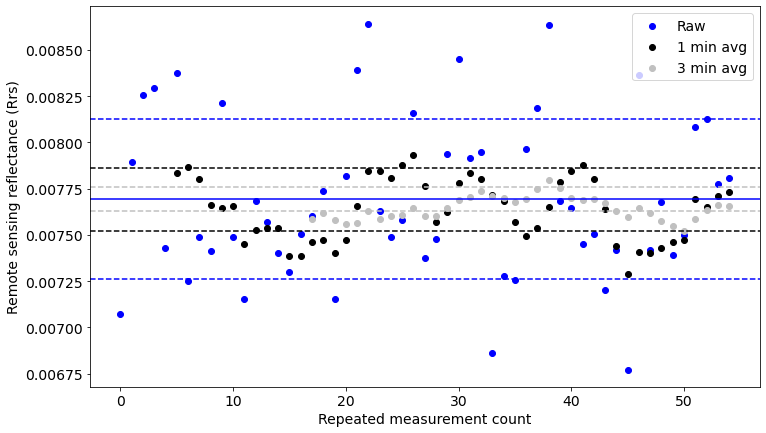

In [53]:
fig, ax = plt.subplots(figsize=(12,7))

for l,u,c in [[156,161,'blue']]:
    band_mean = static_trios_df.iloc[:, l:u].mean().mean()
    ax.axhline(band_mean,color=c)
    
    for i,c_std in [[1,'blue'],[6,'black'],[6*3,'silver']]:
        band_std = static_trios_df.rolling(window=i).mean().iloc[:, l:u].mean(axis=1).std()
        ax.axhline(band_mean+band_std,color=c_std, ls='--')
        ax.axhline(band_mean-band_std,color=c_std, ls='--')


    ax.scatter(range(len(static_trios_df)),static_trios_df.iloc[:, l:u].mean(axis=1),color=c, alpha=1, label='Raw')
    ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6).mean().iloc[:, l:u].mean(axis=1),color='black', alpha=1, label='1 min avg')
    ax.scatter(range(len(static_trios_df)),static_trios_df.rolling(window=6*3).mean().iloc[:, l:u].mean(axis=1),color='silver', alpha=1, label='3 min avg')
ax.legend(loc='upper right')    
ax.set_ylabel('Remote sensing reflectance (Rrs)')
ax.set_xlabel('Repeated measurement count')
# fig.savefig('repeated_measurements_blue_avg.png',dpi=300)

You need the uncertainties package for this.

In [54]:
# pip install --upgrade uncertainties

In [55]:
from uncertainties import ufloat
from uncertainties.umath import *  # sin(), etc.

In [56]:
blue_u = ufloat(static_trios_df.iloc[:, 156:161].mean().mean(), np.std(static_trios_df.iloc[:, 156:161].mean(axis=1).values))
green_u = ufloat(static_trios_df.iloc[:, 232:240].mean().mean(), np.std(static_trios_df.iloc[:, 232:240].mean(axis=1).values))
red_u = ufloat(static_trios_df.iloc[:, 346:351].mean().mean(), np.std(static_trios_df.iloc[:, 346:351].mean(axis=1).values))
blue_u, green_u, red_u

(0.007692916094545454+/-0.0004316484016933594,
 0.002850563672727273+/-0.0003025047880319788,
 0.000854057709090909+/-0.00020191965759646383)

In [57]:
blue_u = ufloat(static_trios_df.iloc[:, 156:161].mean().mean(), np.std(static_trios_df.iloc[:, 156:161].mean(axis=1).values))
green_u = ufloat(static_trios_df.iloc[:, 232:240].mean().mean(), np.std(static_trios_df.iloc[:, 232:240].mean(axis=1).values))
red_u = ufloat(static_trios_df.iloc[:, 346:351].mean().mean(), np.std(static_trios_df.iloc[:, 346:351].mean(axis=1).values))
blue_u, green_u, red_u

(0.007692916094545454+/-0.0004316484016933594,
 0.002850563672727273+/-0.0003025047880319788,
 0.000854057709090909+/-0.00020191965759646383)

Uncertainty based on the group of wavelengths used to calculate chla.

In [59]:
blue_uncert = np.std(static_trios_df.iloc[:, 156:161].mean(axis=1).values)
green_uncert = np.std(static_trios_df.iloc[:, 232:240].mean(axis=1).values)
red_uncert = np.std(static_trios_df.iloc[:, 346:351].mean(axis=1).values)
blue_uncert, green_uncert, red_uncert

(0.0004316484016933594, 0.0003025047880319788, 0.00020191965759646383)

Uncertainty based on a rolling window average of 6 measurements (1 minute)

In [306]:
blue_uncert = np.nanstd(static_trios_df.rolling(window=6).mean().iloc[:, 156:161].mean(axis=1).values)
green_uncert = np.nanstd(static_trios_df.rolling(window=6).mean().iloc[:, 232:240].mean(axis=1).values)
red_uncert = np.nanstd(static_trios_df.rolling(window=6).mean().iloc[:, 346:351].mean(axis=1).values)
blue_uncert, green_uncert, red_uncert

(0.00016776638783025022, 0.00010788283891465276, 7.161309946806462e-05)

In [62]:
chla_uncerts = []

for i in range(len(trios_df)):
    blue_u = ufloat(trios_df.iloc[i, 156:161].mean(), blue_uncert)
    green_u = ufloat(trios_df.iloc[i, 232:240].mean(), green_uncert) 
    red_u = ufloat(trios_df.iloc[i, 346:351].mean(), red_uncert)
    
    chla_u = oc_index(blue_u, green_u, red_u)
    
    chla_uncert = chla_u.s
    chla_uncerts.append(chla_uncert)

Example of calculating uncertainty

In [63]:
blue_u = ufloat(trios_df.iloc[i, 156:161].mean(), blue_uncert)
green_u = ufloat(trios_df.iloc[i, 232:240].mean(), green_uncert) 
red_u = ufloat(trios_df.iloc[i, 346:351].mean(), red_uncert)

chla_u = oc_index(blue_u, green_u, red_u)

In [64]:
trios_df.iloc[i, 156:161].mean(), blue_uncert

(0.0075986914000000004, 0.0004316484016933594)

In [65]:
-260.43*(10**(-.49+191.7*(0.0024-0.59*0.0064-.41*0.00068)))*0.000167

-0.006779260494532654

In [66]:
(441.41*(10**(-.49+191.7*(0.0024-0.59*0.0064-.41*0.00068)))*0.000107)

0.007362084289281303

In [67]:
(-180.98*(10**(-.49+191.7*(0.0024-0.59*0.0064-.41*0.00068)))*0.0000716)

-0.002019846872409247

In [68]:
import math
math.sqrt(0.0068**2+0.0074**2+0.002**2)

0.010246950765959599

In [69]:
blue_u, green_u, red_u

(0.0075986914000000004+/-0.0004316484016933594,
 0.004682888499999999+/-0.0003025047880319788,
 0.0030533482+/-0.00020191965759646383)

In [70]:
chla_u.error_components()

{0.0075986914000000004+/-0.0004316484016933594: 0.022862937692841537,
 0.0030533482+/-0.00020191965759646383: 0.007448298560927712,
 0.004682888499999999+/-0.0003025047880319788: 0.027181268898308585}

In [71]:
chla_u

0.20360693550654468+/-0.03629066615979417

In [72]:
chla_u

0.20360693550654468+/-0.03629066615979417

In [73]:
trios_df['chla_uncert'] = chla_uncerts

<ipython-input-74-779b19d7db1a>:5: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean(), color='black', lw=3)
<ipython-input-74-779b19d7db1a>:6: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
<ipython-input-74-779b19d7db1a>:7: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')


Text(0.5, 0, 'Wavelength (nm)')

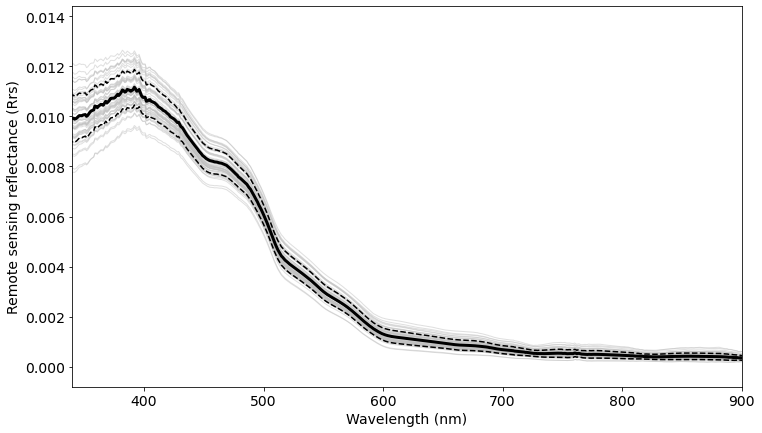

In [74]:
fig, ax = plt.subplots(figsize=(12,7))
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, 1:-2].values.T, color='silver', lw=1, alpha=0.5)
# ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, 1:-2]+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
# ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, 1:-2]-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean(), color='black', lw=3)
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.set_xlim(340,900)
ax.set_ylabel('Remote sensing reflectance (Rrs)')
ax.set_xlabel('Wavelength (nm)')
# fig.savefig('spectrum_repeated.png',dpi=300)

(340.0, 900.0)

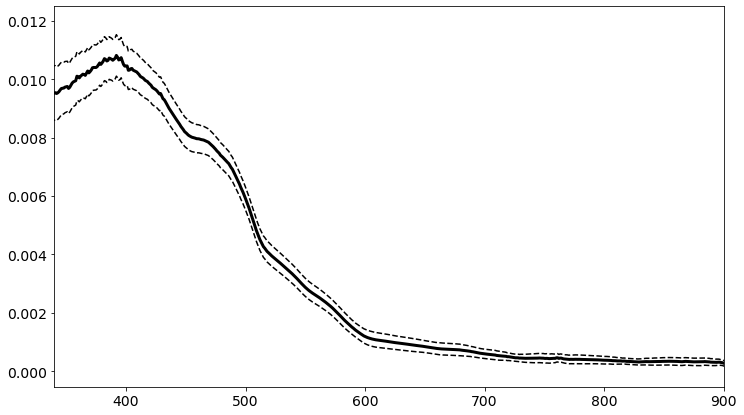

In [75]:
fig, ax = plt.subplots(figsize=(12,7))
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[50, 1:-2], color='black', lw=3)
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[50, 1:-2]+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[50, 1:-2]-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.set_xlim(340,900)


<ipython-input-76-f8aafffdfa3d>:2: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean(), color='black', lw=3)
<ipython-input-76-f8aafffdfa3d>:3: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
<ipython-input-76-f8aafffdfa3d>:4: FutureWarning: DataFrame.mean and DataFrame.median with numeric_only=None will include datetime64 and datetime64tz columns in a future version.
  ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')


(340.0, 900.0)

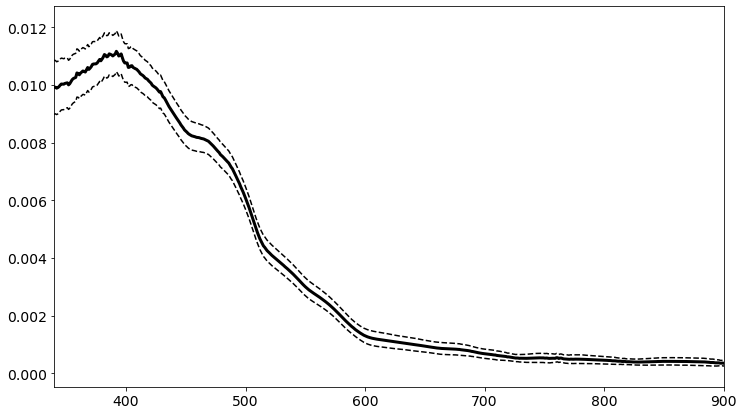

In [76]:
fig, ax = plt.subplots(figsize=(12,7))
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean(), color='black', lw=3)
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()+static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), static_trios_df.iloc[:, :-1].mean()-static_trios_df.iloc[:, :-2].std(), color='black', ls='--')
ax.set_xlim(340,900)


### Now look at this on a specific transect

In [29]:
transect = 2
df_transect = df.loc[start_times[transect]:end_times[transect]]
trios_df_transect = trios_df.loc[start_times[transect]:end_times[transect]]
cdom_df_transect = cdom_df.loc[start_times[transect]:end_times[transect]]

Text(0.5, 1.0, '')

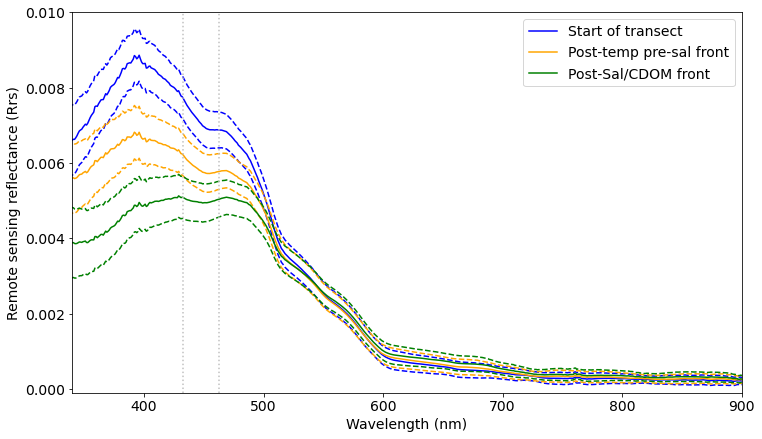

In [79]:
fig,ax = plt.subplots(figsize=(12,7))
ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2],label='Start of transect', color='blue',)
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.iloc[:, :-2].std(), color='blue', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.iloc[:, :-2].std(), color='blue', ls='--')


# trios_df_transect.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
# trios_df_transect.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
# trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')


# trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp pre-sal front')
ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2],label='Post-temp pre-sal front', color='orange',)
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.iloc[:, :-2].std(), color='orange', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.iloc[:, :-2].std(), color='orange', ls='--')



ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2],label='Post-Sal/CDOM front',  color='green', )
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.iloc[:, :-2].std(), color='green', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.iloc[:, :-2].std(), color='green', ls='--')


ax.axvline(443-10, color='silver', ls='dotted')
ax.axvline(443+20, color='silver', ls='dotted')

ax.legend()
ax.set_ylabel('Remote sensing reflectance (Rrs)')
ax.set_xlabel('Wavelength (nm)')

ax.set_xlim(340,900)
ax.set_ylim(-0.0001,0.01)

ax.set_title('')


# plt.savefig('radiometry_spectra_across_front.png',dpi=300)


(-0.0001, 0.01)

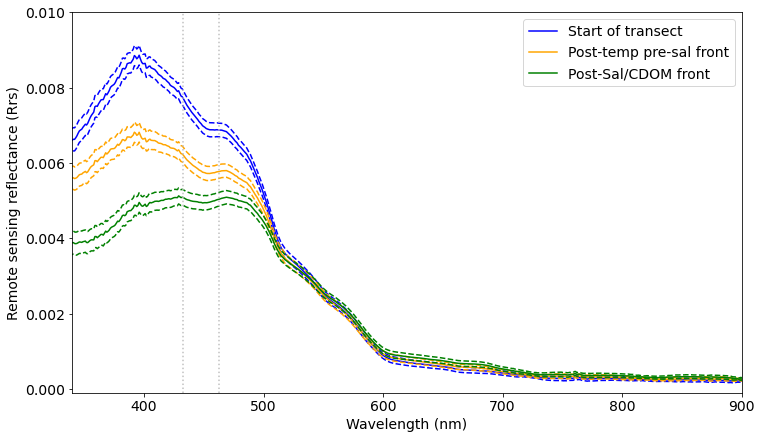

In [80]:
fig,ax = plt.subplots(figsize=(12,7))
ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2],label='Start of transect', color='blue',)
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='blue', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='blue', ls='--')


# trios_df_transect.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
# trios_df_transect.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
# trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')

# trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp pre-sal front')
ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2],label='Post-temp pre-sal front', color='orange',)
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='orange', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='orange', ls='--')



ax.plot(static_trios_df.columns[1:-2].astype(int),trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2],label='Post-Sal/CDOM front',  color='green', )
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2]+static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='green', ls='--')
ax.plot(static_trios_df.columns[1:-2].astype(int), trios_df_transect.loc['2021-08-27 17:34:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2]-static_trios_df.rolling(6).mean().iloc[:, :-2].std(), color='green', ls='--')


ax.axvline(443-10, color='silver', ls='dotted')
ax.axvline(443+20, color='silver', ls='dotted')

ax.legend()
ax.set_ylabel('Remote sensing reflectance (Rrs)')
ax.set_xlabel('Wavelength (nm)')

ax.set_xlim(340,900)
ax.set_ylim(-0.0001,0.01)



# plt.savefig('radiometry_spectra_across_front_binned.png',dpi=300)


In [81]:
start_times[transect]

'2021-08-27 16:09:00'

In [82]:
end_times[transect]

'2021-08-27 17:40:00'

In [83]:
plt.rcParams.update({'font.size': 16})

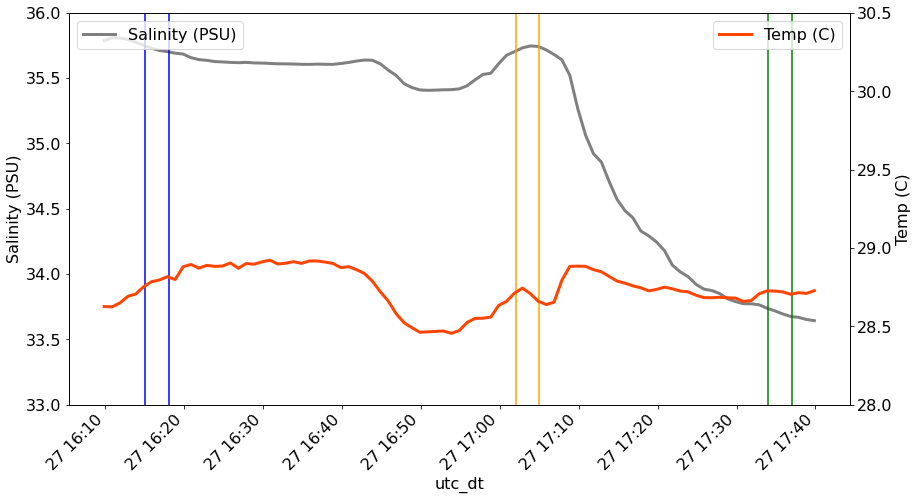

In [84]:
fig, ax = plt.subplots(figsize=(14,8))

df_transect.plot(y='TSG--sal',ax=ax, linewidth=3, color='grey', label='Salinity (PSU)')
ax.set_ylim(33,36)

ax1 = ax.twinx()
df_transect.plot(y='TSG--temp-SBE38',ax=ax1, linewidth=3, color='orangered', label='Temp (C)')
ax1.set_ylim(28,30.5)

ax.axvline('2021-08-27 16:15:00',color='blue')
ax.axvline('2021-08-27 16:18:00',color='blue')

ax.axvline('2021-08-27 17:02:00',color='orange')
ax.axvline('2021-08-27 17:05:00',color='orange')

ax.axvline('2021-08-27 17:34:00',color='green')
ax.axvline('2021-08-27 17:37:00',color='green')

ax.legend(loc='upper left')
ax1.legend(loc='upper right')
ax.set_ylabel('Salinity (PSU)')
ax1.set_ylabel('Temp (C)')

# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
# fig.savefig('sal_temp_front.png')

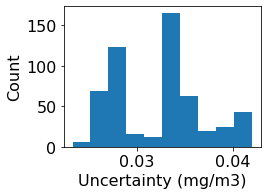

In [86]:
fig, ax = plt.subplots(figsize=(4,3))
ax.hist(trios_df_transect['chla_uncert'])
ax.set_ylabel('Count')
ax.set_xlabel('Uncertainty (mg/m3)')
fig.tight_layout()
# fig.savefig('uncertanty_distribution.png',dpi=300)

In [87]:
trios_df_transect['chla_oci']

utc_dt
2021-08-27 16:09:00    0.151699
2021-08-27 16:09:10    0.153381
2021-08-27 16:09:20    0.151364
2021-08-27 16:09:30    0.147087
2021-08-27 16:09:40    0.149037
                         ...   
2021-08-27 17:39:20    0.232420
2021-08-27 17:39:30    0.227189
2021-08-27 17:39:40    0.233379
2021-08-27 17:39:50    0.235517
2021-08-27 17:40:00    0.221562
Name: chla_oci, Length: 541, dtype: float64

The uncertainty is basically proportional to the chla

In [88]:
np.unique(trios_df_transect['chla_uncert']/trios_df_transect['chla_oci'])

array([0.17823885, 0.17823885, 0.17823885, 0.17823885])

In [325]:
trios_df_transect['chla_oci']

utc_dt
2021-08-27 16:09:00    0.151699
2021-08-27 16:09:10    0.153381
2021-08-27 16:09:20    0.151364
2021-08-27 16:09:30    0.147087
2021-08-27 16:09:40    0.149037
                         ...   
2021-08-27 17:39:20    0.232420
2021-08-27 17:39:30    0.227189
2021-08-27 17:39:40    0.233379
2021-08-27 17:39:50    0.235517
2021-08-27 17:40:00    0.221562
Name: chla_oci, Length: 541, dtype: float64

In [89]:
trios_df_transect['chla_uncert']

utc_dt
2021-08-27 16:09:00    0.027039
2021-08-27 16:09:10    0.027338
2021-08-27 16:09:20    0.026979
2021-08-27 16:09:30    0.026217
2021-08-27 16:09:40    0.026564
                         ...   
2021-08-27 17:39:20    0.041426
2021-08-27 17:39:30    0.040494
2021-08-27 17:39:40    0.041597
2021-08-27 17:39:50    0.041978
2021-08-27 17:40:00    0.039491
Name: chla_uncert, Length: 541, dtype: float64

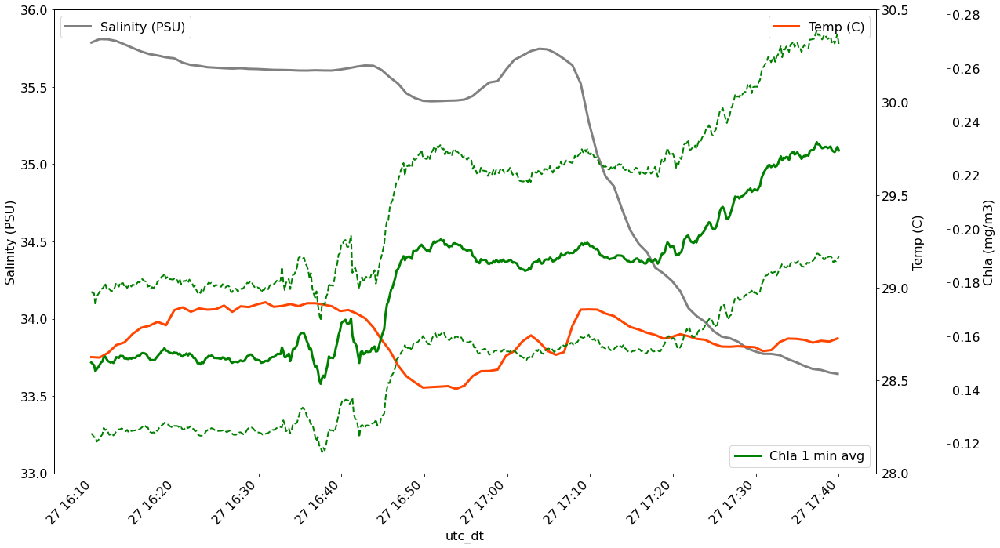

In [90]:
fig, ax = plt.subplots(figsize=(18,10))

df_transect.plot(y='TSG--sal',ax=ax, linewidth=3, color='grey', label='Salinity (PSU)')
ax.set_ylim(33,36)

ax1 = ax.twinx()
df_transect.plot(y='TSG--temp-SBE38',ax=ax1, linewidth=3, color='orangered', label='Temp (C)')
ax1.set_ylim(28,30.5)

ax2 = ax.twinx()

trios_df_transect['chla_oci'].rolling(window=6).mean().plot(ax=ax2, color='green', label='Chla 1 min avg', linewidth=3)
(trios_df_transect['chla_oci'].rolling(window=6).mean()-trios_df_transect['chla_uncert']).plot(ax=ax2, color='green', label='', linewidth=2, ls='--')
(trios_df_transect['chla_oci'].rolling(window=6).mean()+trios_df_transect['chla_uncert']).plot(ax=ax2, color='green', label='', linewidth=2, ls='--')

# ax.axvline('2021-08-27 16:15:00',color='blue')
# ax.axvline('2021-08-27 16:18:00',color='blue')

# ax.axvline('2021-08-27 17:02:00',color='orange')
# ax.axvline('2021-08-27 17:05:00',color='orange')

# ax.axvline('2021-08-27 17:34:00',color='green')
# ax.axvline('2021-08-27 17:37:00',color='green')

ax.legend(loc='upper left')
ax1.legend(loc='upper right')
ax2.legend(loc='lower right')

ax.set_ylabel('Salinity (PSU)')
ax1.set_ylabel('Temp (C)')
ax2.set_ylabel('Chla (mg/m3)')

ax2.spines['right'].set_position(('outward', 90))

# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
fig.tight_layout()
# fig.savefig('chla_uncert_sal_temp.png')

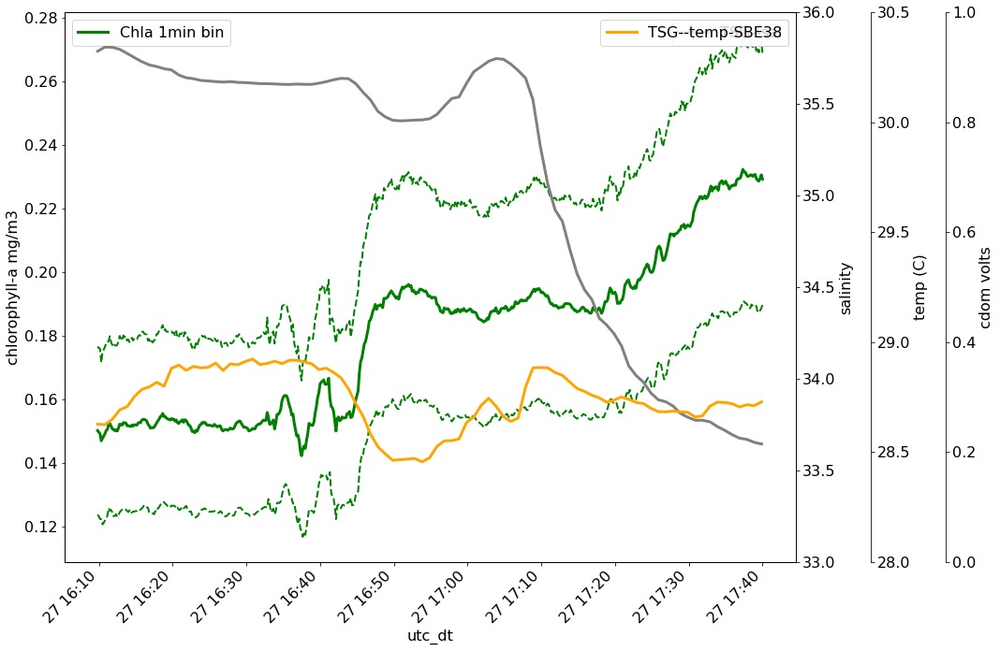

In [91]:
fig, ax = plt.subplots(figsize=(14,12))

ax2 = ax.twinx()
ax3 = ax.twinx()
ax4 = ax.twinx()

ax3.spines['right'].set_position(('outward', 80))
ax4.spines['right'].set_position(('outward', 160))


df_transect.plot(y='TSG--sal',ax=ax2, linewidth=3, color='grey')
ax2.set_ylim(33,36)

df_transect.plot(y='TSG--temp-SBE38',ax=ax3, linewidth=3, color='orange')
ax3.set_ylim(28,30.5)

trios_df_transect['chla_oci'].rolling(window=6).mean().plot(ax=ax, color='green', label='Chla 1min bin', linewidth=3)
(trios_df_transect['chla_oci'].rolling(window=6).mean()-trios_df_transect['chla_uncert']).plot(ax=ax, color='green', label='', linewidth=2, ls='--')
(trios_df_transect['chla_oci'].rolling(window=6).mean()+trios_df_transect['chla_uncert']).plot(ax=ax, color='green', label='', linewidth=2, ls='--')

ax.legend(loc='upper left')
ax.set_ylabel('chlorophyll-a mg/m3')
ax2.set_ylabel('salinity')
ax3.set_ylabel('temp (C)')
ax4.set_ylabel('cdom volts')


# ax.set_ylim(0.000,0.012)
fig.autofmt_xdate(rotation=45)
# fig.savefig('chla_uncert_sal_temp.png')

### Explore the radiometer data a bit more

Checking out and clustering a transect

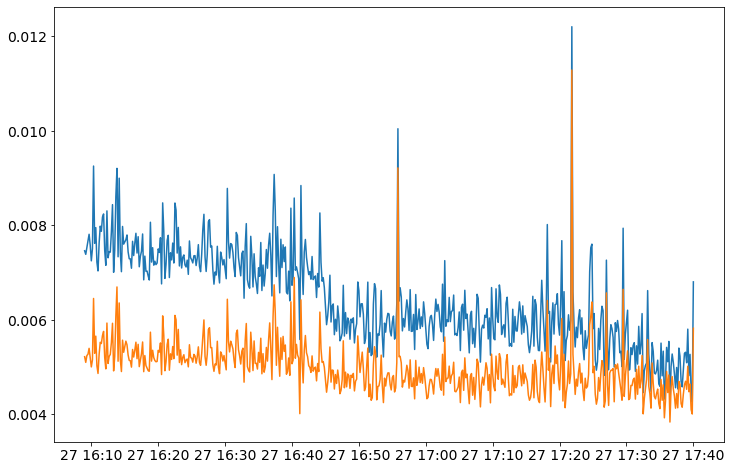

In [79]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(trios_df_transect['440'].rolling(window=1).mean())
ax.plot(trios_df_transect['500'].rolling(window=1).mean())


In [317]:
len(start_times)

13

In [34]:
transect = 12
df_transect = df.loc[start_times[transect]:end_times[transect]]
trios_df_transect = trios_df.loc[start_times[transect]:end_times[transect]]
cdom_df_transect = cdom_df.loc[start_times[transect]:end_times[transect]]


In [35]:
# Calculate rolling median
rolling_440 = trios_df_transect['440'].rolling(window=6*2).median()
upper_threshold = 0.0005
lower_threshold = -0.0005

# all in one line 
df_filtered = trios_df_transect.drop(trios_df_transect[(trios_df_transect['440']-rolling_440>upper_threshold)|(trios_df_transect['440']- rolling_440<lower_threshold)].index) 
# if you want to drop the column as well
# del df["rolling_temp"]

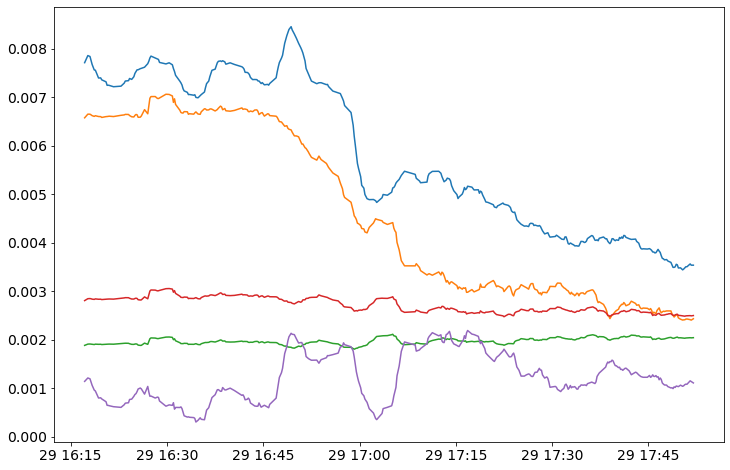

In [36]:
fig, ax = plt.subplots(figsize=(12,8))
# ax.plot(trios_df_transect['440'].rolling(window=1).mean())
# ax.plot(trios_df_transect['460'].rolling(window=1).mean())
# ax.plot(trios_df_transect['440'].rolling(window=6*3).mean())
# ax.plot(df_filtered['440'])
ax.plot(df_filtered['440'].rolling(window=6*2).mean())
ax.plot(df_filtered['440'].rolling(window=6*2).mean()-df_filtered['660'].rolling(window=6*2).mean())
ax.plot(df_filtered['550'].rolling(window=6*2).mean()-df_filtered['660'].rolling(window=6*2).mean())

ax.plot(df_filtered['520'].rolling(window=6*2).mean()-df_filtered['660'].rolling(window=6*2).mean())


ax.plot(df_filtered['660'].rolling(window=6*2).mean())

# ax.set_ylim(0.002,0.01)
# trios_df_transect.plot('440')

In [37]:
df_filtered.iloc[:,1:-2]

,320,321,322,323,324,325,326,327,328,329,...,941,942,943,944,945,946,947,948,949,950
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-08-29 16:15:10,0.005114,0.005222,0.005263,0.005213,0.005151,0.005104,0.005136,0.005065,0.004927,0.004996,...,-0.000540,-0.000588,-0.000501,-0.000380,-0.000261,-0.000355,-0.000570,-0.000821,-0.000906,-0.000869
2021-08-29 16:15:20,0.005856,0.005944,0.005960,0.005886,0.005808,0.005748,0.005771,0.005692,0.005550,0.005628,...,0.000032,-0.000098,0.000016,0.000121,0.000225,0.000099,-0.000029,-0.000143,-0.000068,0.000041
2021-08-29 16:15:30,0.007062,0.007106,0.007089,0.007012,0.006933,0.006873,0.006898,0.006812,0.006656,0.006719,...,0.000774,0.000721,0.000598,0.000537,0.000477,0.000580,0.000604,0.000588,0.000598,0.000657
2021-08-29 16:15:40,0.006130,0.006210,0.006234,0.006173,0.006105,0.006053,0.006076,0.005999,0.005859,0.005925,...,0.000475,0.000510,0.000535,0.000505,0.000473,0.000465,0.000465,0.000468,0.000540,0.000640
2021-08-29 16:15:50,0.006626,0.006690,0.006703,0.006633,0.006552,0.006487,0.006513,0.006442,0.006306,0.006369,...,-0.000072,-0.000043,0.000073,0.000190,0.000306,0.000350,0.000381,0.000411,0.000389,0.000327
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-29 17:50:50,0.003403,0.003446,0.003451,0.003403,0.003342,0.003295,0.003297,0.003224,0.003109,0.003144,...,0.000499,0.000532,0.000503,0.000487,0.000472,0.000479,0.000473,0.000461,0.000465,0.000468
2021-08-29 17:51:00,0.003165,0.003203,0.003202,0.003158,0.003104,0.003064,0.003071,0.003000,0.002887,0.002922,...,0.000216,0.000156,0.000135,0.000163,0.000192,0.000211,0.000224,0.000234,0.000240,0.000236
2021-08-29 17:51:30,0.003332,0.003375,0.003376,0.003336,0.003281,0.003240,0.003246,0.003172,0.003055,0.003089,...,0.001219,0.001187,0.001195,0.001245,0.001295,0.001343,0.001358,0.001360,0.001333,0.001300


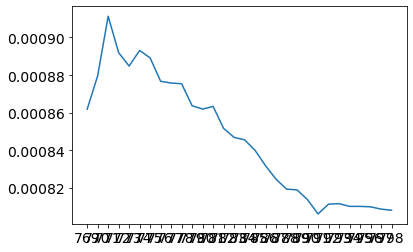

In [38]:
plt.plot(df_filtered.iloc[:,450:480].mean())

In [39]:
corrected_specs = []
for i in range(len(df_filtered.iloc[:,1:-2])):
    corrected_specs.append(df_filtered.iloc[i,1:-2] - df_filtered.iloc[i,450:480].mean())

In [40]:
corrected_specs = pd.DataFrame(corrected_specs, columns=df_filtered.columns[1:-2] )

In [41]:
corrected_specs['chla_oci'] = oc_index(corrected_specs.iloc[:, 156:161].mean(axis=1).values, corrected_specs.iloc[:, 232:240].mean(axis=1).values, corrected_specs.iloc[:, 346:351].mean(axis=1).values)

In [42]:
corrected_specs['TimeStamp'] = df_filtered['TimeStamp']

<AxesSubplot:xlabel='utc_dt'>

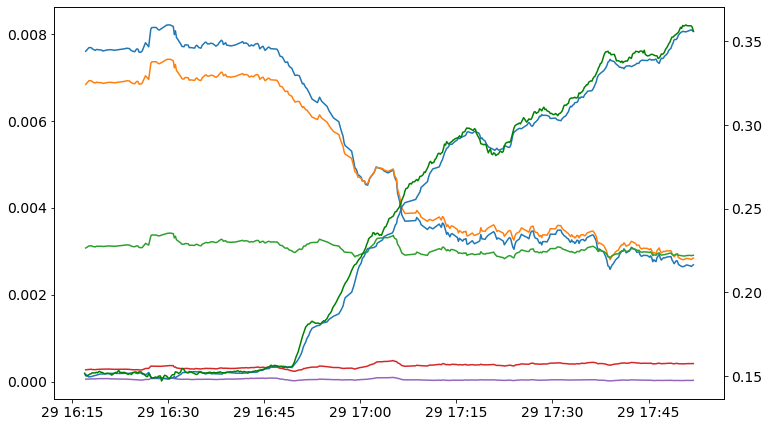

In [43]:
fig, ax = plt.subplots(figsize=(12,8))
ax.plot(corrected_specs['420'].rolling(window=6*2).mean())
ax.plot(corrected_specs['440'].rolling(window=6*2).mean())

ax.plot(corrected_specs['520'].rolling(window=6*2).mean())


ax.plot(corrected_specs['660'].rolling(window=6*2).mean())
ax.plot(corrected_specs['750'].rolling(window=6*2).mean())

ax2 = ax.twinx()
ax2.plot(corrected_specs['chla_oci'].rolling(window=6*2).mean())
trios_df_transect['chla_oci'].rolling(window=6*2).mean().plot(ax=ax2, color='green')

# ax.set_ylim(0.002,0.01)
# trios_df_transect.plot('440')

In [100]:
trios_df_transect

,TimeStamp,320,321,322,323,324,325,326,327,328,...,943,944,945,946,947,948,949,950,datetime,chla_oci
utc_dt,,,,,,,,,,,,,,,,,,,,,
2021-08-29 16:15:10,8/29/2021 12:15:10,0.005114,0.005222,0.005263,0.005213,0.005151,0.005104,0.005136,0.005065,0.004927,...,-0.000501,-0.000380,-0.000261,-0.000355,-0.000570,-0.000821,-0.000906,-0.000869,2021-08-29 12:15:10,0.169043
2021-08-29 16:15:20,8/29/2021 12:15:20,0.005856,0.005944,0.005960,0.005886,0.005808,0.005748,0.005771,0.005692,0.005550,...,0.000016,0.000121,0.000225,0.000099,-0.000029,-0.000143,-0.000068,0.000041,2021-08-29 12:15:20,0.150944
2021-08-29 16:15:30,8/29/2021 12:15:30,0.007062,0.007106,0.007089,0.007012,0.006933,0.006873,0.006898,0.006812,0.006656,...,0.000598,0.000537,0.000477,0.000580,0.000604,0.000588,0.000598,0.000657,2021-08-29 12:15:30,0.150044
2021-08-29 16:15:40,8/29/2021 12:15:40,0.006130,0.006210,0.006234,0.006173,0.006105,0.006053,0.006076,0.005999,0.005859,...,0.000535,0.000505,0.000473,0.000465,0.000465,0.000468,0.000540,0.000640,2021-08-29 12:15:40,0.146196
2021-08-29 16:15:50,8/29/2021 12:15:50,0.006626,0.006690,0.006703,0.006633,0.006552,0.006487,0.006513,0.006442,0.006306,...,0.000073,0.000190,0.000306,0.000350,0.000381,0.000411,0.000389,0.000327,2021-08-29 12:15:50,0.148591
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-29 17:51:20,8/29/2021 13:51:20,0.004854,0.004898,0.004895,0.004826,0.004736,0.004664,0.004668,0.004576,0.004427,...,0.001078,0.001156,0.001232,0.001153,0.001040,0.000924,0.000928,0.001006,2021-08-29 13:51:20,0.351027
2021-08-29 17:51:30,8/29/2021 13:51:30,0.003332,0.003375,0.003376,0.003336,0.003281,0.003240,0.003246,0.003172,0.003055,...,0.001195,0.001245,0.001295,0.001343,0.001358,0.001360,0.001333,0.001300,2021-08-29 13:51:30,0.361415
2021-08-29 17:51:40,8/29/2021 13:51:40,0.002666,0.002694,0.002687,0.002651,0.002599,0.002559,0.002560,0.002492,0.002386,...,0.000652,0.000668,0.000681,0.000725,0.000757,0.000782,0.000729,0.000647,2021-08-29 13:51:40,0.364495


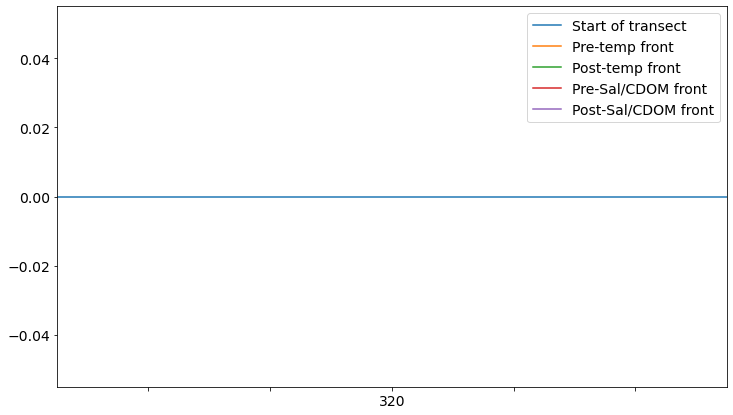

In [96]:
fig,ax = plt.subplots(figsize=(12,7))
trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2].plot(label='Start of transect')

trios_df_transect.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
trios_df_transect.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')
trios_df_transect.loc['2021-08-27 17:23:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-Sal/CDOM front')

ax.axhline(0)

ax.legend()
# plt.savefig('radiometry_spectra.png')


In [ ]:
fig,ax = plt.subplots(figsize=(12,7))
trios_df_transect.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2].plot(label='Start of transect')

trios_df_transect.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
trios_df_transect.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
trios_df_transect.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')
trios_df_transect.loc['2021-08-27 17:23:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-Sal/CDOM front')

ax.axhline(0)

ax.legend()
# plt.savefig('radiometry_spectra.png')


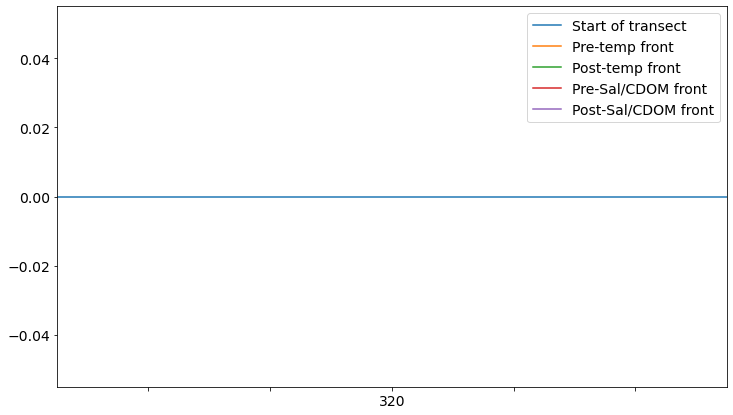

In [45]:
fig,ax = plt.subplots(figsize=(12,7))
corrected_specs.loc['2021-08-27 16:15:00':'2021-08-27 16:20:00'].median(numeric_only=True).iloc[:-2].plot(label='Start of transect')

corrected_specs.loc['2021-08-27 16:37:00':'2021-08-27 16:43:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-temp front')
corrected_specs.loc['2021-08-27 16:48:00':'2021-08-27 16:53:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-temp front')
corrected_specs.loc['2021-08-27 17:02:00':'2021-08-27 17:08:00'].median(numeric_only=True).iloc[:-2].plot(label='Pre-Sal/CDOM front')
corrected_specs.loc['2021-08-27 17:23:00':'2021-08-27 17:38:00'].median(numeric_only=True).iloc[:-2].plot(label='Post-Sal/CDOM front')

ax.axhline(0)

ax.legend()
# plt.savefig('radiometry_spectra.png')


In [ ]:
16:20-16:30, pelgic side of front, 16:53-16:56 at front, 17:15-17:20 coastal side of front before secondary front, 17:40-17:45 coastal side of both fronts

In [106]:
corrected_specs.loc['2021-08-29 16:20:00':'2021-08-29 16:25:00'].median(numeric_only=True).iloc[:-5]

320    0.005382
321    0.005458
322    0.005472
323    0.005399
324    0.005313
         ...   
946   -0.000337
947   -0.000295
948   -0.000282
949   -0.000279
950   -0.000264
Length: 631, dtype: float64

In [117]:
corrected_specs.loc['2021-08-29 17:53:00':'2021-08-29 17:59:00']

,320,321,322,323,324,325,326,327,328,329,...,948,949,950,chla_oci,TimeStamp,lat,lon,sal,temp,geometry


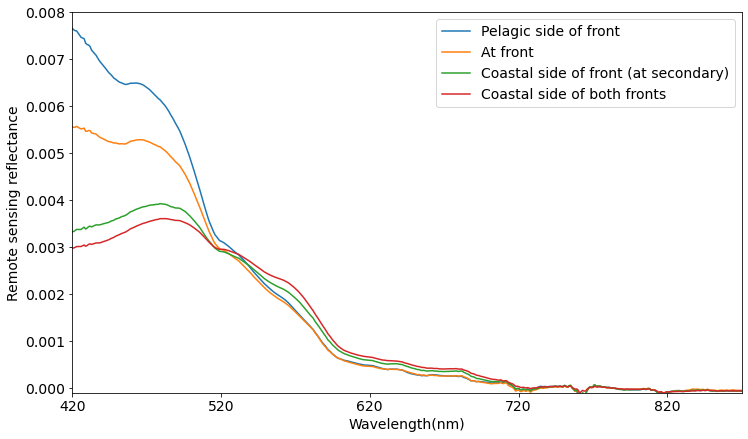

In [129]:
fig,ax = plt.subplots(figsize=(12,7))
corrected_specs.loc['2021-08-29 16:20:00':'2021-08-29 16:25:00'].median(numeric_only=True).iloc[:-5].plot(label='Pelagic side of front')
corrected_specs.loc['2021-08-29 16:53:00':'2021-08-29 16:56:00'].median(numeric_only=True).iloc[:-5].plot(label='At front')
corrected_specs.loc['2021-08-29 17:15:00':'2021-08-29 17:20:00'].median(numeric_only=True).iloc[:-5].plot(label='Coastal side of front (at secondary)')
corrected_specs.loc['2021-08-29 17:40:00':'2021-08-29 17:45:00'].median(numeric_only=True).iloc[:-5].plot(label='Coastal side of both fronts')

# ax.axhline(0)
ax.set_xlim(100,550)
ax.set_ylim(-0.0001,0.008)
ax.set_xlabel('Wavelength(nm)')
ax.set_ylabel('Remote sensing reflectance')

ax.legend()
plt.savefig('figs/aug2916_radiometry_spectra.png')


In [229]:
trios_subset[kmeans.labels_==0].iloc[:,:-7].values.T.mean(axis=1).shape

(631,)

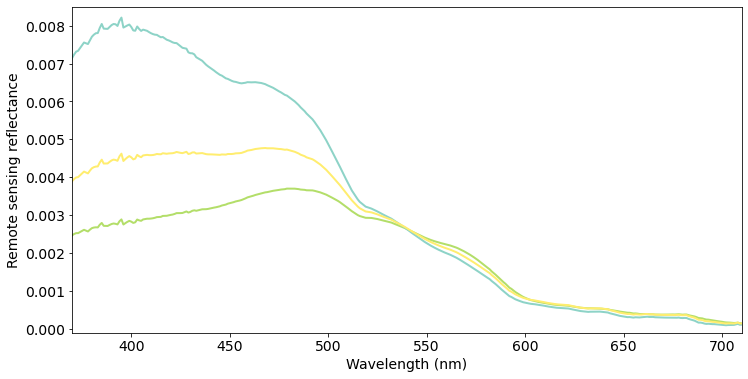

In [238]:
color_list = plt.cm.Set3(np.linspace(0, 1, 3))
color_list

fig, ax = plt.subplots(figsize=(12,6))
ax.set_xlim(370,710)
ax.set_ylim(-0.0001,0.0085)
# ax.axvline(120, c='k', ls='--')
# ax.axvline(535-125, c='k', ls='--')
# ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==0].iloc[:,:-7].values.T,c=color_list[1], alpha=.01)
# ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==1].iloc[:,:-7].values.T,c=color_list[0], alpha=.01)
# ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==2].iloc[:,:-7].values.T,c=color_list[2], alpha=.01)

ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==0].iloc[:,:-7].values.T.mean(axis=1),c=color_list[1], alpha=1, lw=2)
ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==1].iloc[:,:-7].values.T.mean(axis=1),c=color_list[0], alpha=1, lw=2)
ax.plot(trios_subset.columns[:-7].astype(int), trios_subset[kmeans.labels_==2].iloc[:,:-7].values.T.mean(axis=1),c=color_list[2], alpha=1, lw=2)

# trios_subset[kmeans.labels_==0].iloc[:,:-8].plot(label='Pelagic side of front', ax=ax, c=color_list[1], lw=3)
# trios_subset[kmeans.labels_==1].median(numeric_only=True).iloc[:-5].plot(label='Pelagic side of front', ax=ax, c=color_list[0], lw=3)
# trios_subset[kmeans.labels_==2].median(numeric_only=True).iloc[:-5].plot(label='Pelagic side of front', ax=ax, c=color_list[2], lw=3)

ax.set_xlabel('Wavelength (nm)')
ax.set_ylabel('Remote sensing reflectance')

fig.savefig('figs/aug2916_trios_clusters_spectra.png',dpi=300)

In [243]:
trios_subset['cluster'] = kmeans.labels_

/srv/conda/envs/notebook/lib/python3.8/site-packages/geopandas/geodataframe.py:1322: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super(GeoDataFrame, self).__setitem__(key, value)


In [245]:
trios_subset.to_csv('trios_clusters_spectra.csv')

In [242]:
trios_subset.shape

(344, 638)

In [46]:
lats = []
lons = []
sals = []
temps = []
for i in range(len(corrected_specs)):
    row = df.iloc[df.index.get_loc(pd.to_datetime(corrected_specs.iloc[i].TimeStamp) + timedelta(hours=4), method='nearest')]
    lats.append(row.lat)
    lons.append(row.lon)
    sals.append(row['TSG--sal'])
    temps.append(row['TSG--temp-SBE38'])

In [47]:
corrected_specs['lat'] = lats
corrected_specs['lon'] = lons
corrected_specs['sal'] = sals
corrected_specs['temp'] = temps

In [48]:
trios_gdf = gpd.GeoDataFrame(
    corrected_specs, geometry=gpd.points_from_xy(corrected_specs.lon, corrected_specs.lat))

<AxesSubplot:>

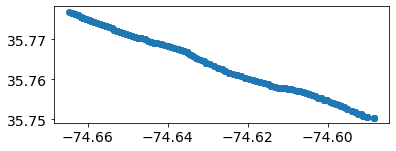

In [49]:
trios_gdf.plot()

In [50]:
trios_gdf.columns

Index(['320', '321', '322', '323', '324', '325', '326', '327', '328', '329',
       ...
       '948', '949', '950', 'chla_oci', 'TimeStamp', 'lat', 'lon', 'sal',
       'temp', 'geometry'],
      dtype='object', length=638)

In [51]:
chlci = trios_gdf.chla_oci.values

In [52]:
trios_gdf.iloc[:,1:-7]

,321,322,323,324,325,326,327,328,329,330,...,941,942,943,944,945,946,947,948,949,950
2021-08-29 16:15:10,0.005342,0.005383,0.005333,0.005271,0.005224,0.005256,0.005184,0.005047,0.005116,0.005195,...,-0.000420,-0.000468,-0.000381,-0.000260,-0.000141,-0.000235,-0.000450,-0.000701,-0.000786,-0.000749
2021-08-29 16:15:20,0.005442,0.005458,0.005385,0.005306,0.005246,0.005269,0.005190,0.005048,0.005126,0.005227,...,-0.000469,-0.000600,-0.000486,-0.000381,-0.000276,-0.000403,-0.000530,-0.000644,-0.000569,-0.000461
2021-08-29 16:15:30,0.005799,0.005783,0.005705,0.005626,0.005566,0.005592,0.005506,0.005350,0.005413,0.005506,...,-0.000533,-0.000585,-0.000709,-0.000770,-0.000830,-0.000726,-0.000702,-0.000719,-0.000709,-0.000649
2021-08-29 16:15:40,0.005119,0.005142,0.005082,0.005014,0.004962,0.004985,0.004908,0.004768,0.004834,0.004930,...,-0.000616,-0.000581,-0.000557,-0.000587,-0.000618,-0.000626,-0.000626,-0.000623,-0.000551,-0.000451
2021-08-29 16:15:50,0.005650,0.005663,0.005593,0.005512,0.005448,0.005473,0.005402,0.005266,0.005329,0.005418,...,-0.001112,-0.001083,-0.000967,-0.000850,-0.000734,-0.000690,-0.000659,-0.000629,-0.000651,-0.000712
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
2021-08-29 17:50:50,0.002661,0.002665,0.002617,0.002556,0.002509,0.002511,0.002439,0.002323,0.002358,0.002402,...,-0.000287,-0.000253,-0.000283,-0.000298,-0.000314,-0.000306,-0.000312,-0.000325,-0.000320,-0.000317
2021-08-29 17:51:00,0.002705,0.002704,0.002660,0.002607,0.002566,0.002573,0.002503,0.002389,0.002424,0.002466,...,-0.000282,-0.000342,-0.000362,-0.000335,-0.000305,-0.000286,-0.000274,-0.000263,-0.000257,-0.000262
2021-08-29 17:51:30,0.002004,0.002005,0.001965,0.001910,0.001868,0.001874,0.001801,0.001684,0.001718,0.001763,...,-0.000152,-0.000184,-0.000176,-0.000126,-0.000076,-0.000028,-0.000013,-0.000011,-0.000038,-0.000071
2021-08-29 17:51:40,0.001947,0.001940,0.001903,0.001852,0.001812,0.001813,0.001745,0.001639,0.001675,0.001718,...,-0.000132,-0.000139,-0.000095,-0.000079,-0.000066,-0.000023,0.000010,0.000035,-0.000018,-0.000100


In [53]:
chlci[chlci>.5] = .5

(0.1, 0.4)

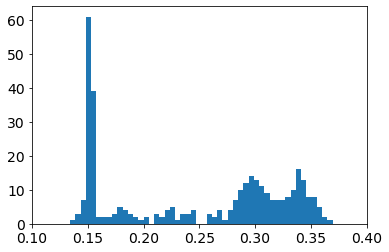

In [54]:
plt.hist(chlci, bins=50)
plt.xlim(0.1,.4)

Run some clustering

In [55]:
trios_gdf.columns[1:-7]

Index(['321', '322', '323', '324', '325', '326', '327', '328', '329', '330',
       ...
       '941', '942', '943', '944', '945', '946', '947', '948', '949', '950'],
      dtype='object', length=630)

In [56]:
from sklearn.cluster import KMeans
kmeans = KMeans(n_clusters=5, random_state=0).fit(trios_gdf.values[:,1:-7])

In [57]:
np.unique(kmeans.labels_, return_counts=True)

(array([0, 1, 2, 3, 4], dtype=int32), array([ 18,  95, 109,  38,  84]))

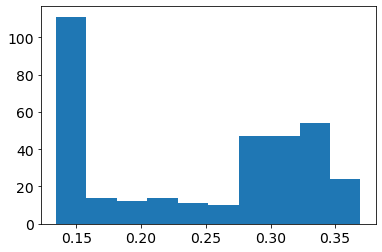

In [58]:
plt.hist(trios_gdf.chla_oci)
plt.show()

Text(0.5, 1.0, 'August 27th Trios Radiometer based Chla')

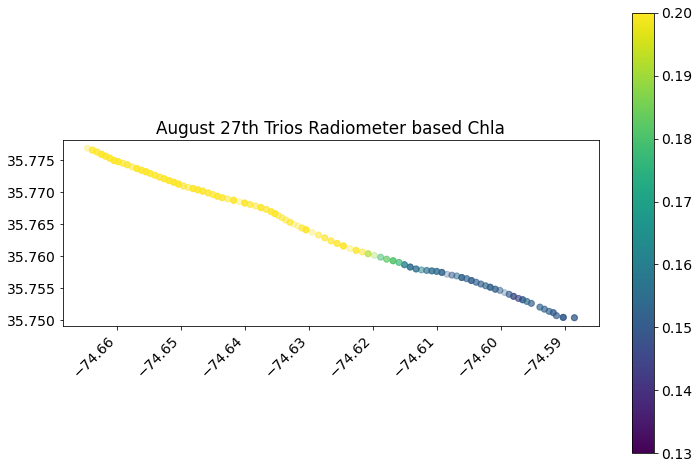

In [59]:
kmeans = KMeans(n_clusters=3, random_state=0).fit(trios_gdf.values[:,1:-7])
fig, ax = plt.subplots(figsize=(12,9))
sc = trios_gdf.plot('chla_oci', ax=ax, vmin=.13,vmax=.20, cmap='viridis', alpha=0.3, label='CI Chla', legend=True)
# ss = ax.scatter(trios_gdf.lon, trios_gdf.lat, c=trios_gdf.chl, s=100)
# fig.colorbar(sc,ax=ax)
# fig.colorbar(sc, ax=ax)
fig.autofmt_xdate(rotation=45)
ax.set_title('August 27th Trios Radiometer based Chla')
# fig.savefig('trios_radiometers_chlaci.png')

<AxesSubplot:>

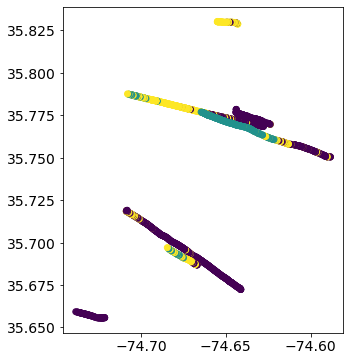

In [134]:
fig, ax = plt.subplots(figsize=(8,6))
trios_gdf.plot(c=kmeans.labels_,ax=ax)

In [135]:
trios_gdf_transect = trios_gdf#.loc['2021-08-27 16:15:00':'2021-08-27 17:30:00']

In [219]:
x = trios_gdf_transect.rolling(window=6).mean().values[:,1:-7]

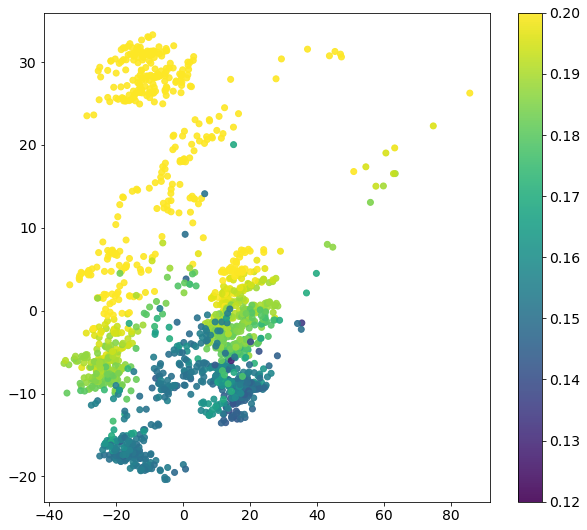

In [220]:
x = trios_gdf_transect.rolling(window=6).mean().values[:,1:-7]
x = x[12:,:]
from sklearn.preprocessing import StandardScaler
# Standardizing the features
x = StandardScaler().fit_transform(x)
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)

fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_gdf_transect['chla_oci'].iloc[12:], vmin=.12,vmax=.20, cmap='viridis', label='chla')
fig.colorbar(sc)

In [221]:
from sklearn.preprocessing import StandardScaler
# Standardizing the features
x = StandardScaler().fit_transform(x)

In [222]:
from sklearn.decomposition import PCA
pca = PCA(n_components=2)
principalComponents = pca.fit_transform(x)

In [140]:
principalComponents.shape

(1544, 2)

<AxesSubplot:>

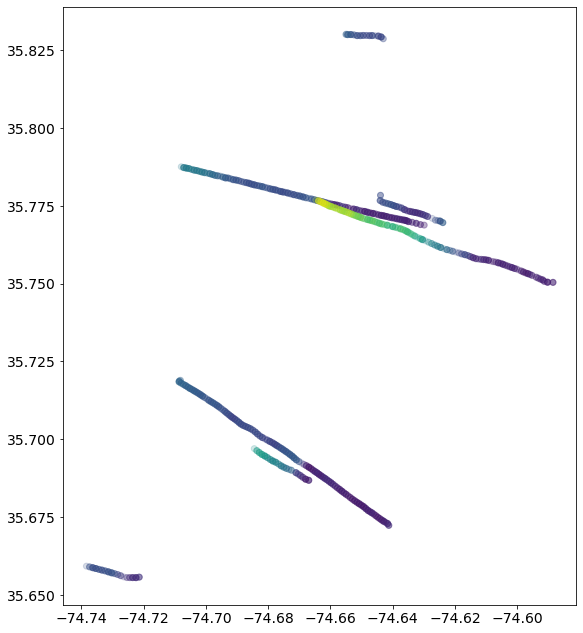

In [141]:
fig, ax = plt.subplots(figsize=(14,11))
trios_gdf_transect.iloc[12:].plot(c=trios_gdf_transect.iloc[12:].chla_oci,ax=ax, alpha=0.2, vmin=0.2, vmax=.24)
# fig.savefig('chla_transect.png')

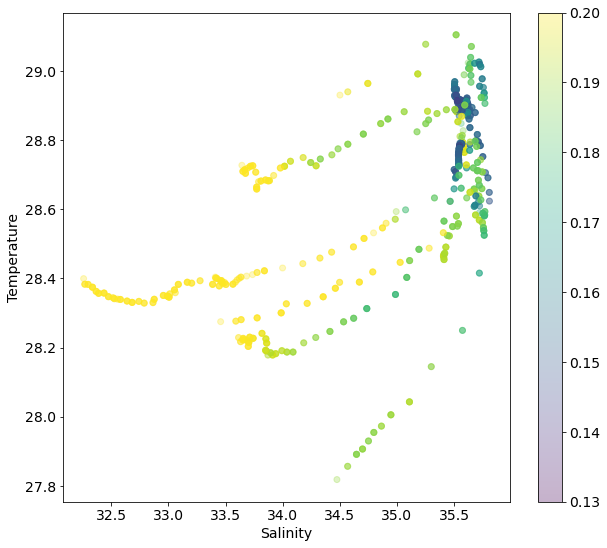

In [144]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(trios_gdf_transect['sal'].iloc[12:], trios_gdf_transect['temp'].iloc[12:], alpha=0.3, c=trios_gdf_transect['chla_oci'].iloc[12:], vmin=.13,vmax=.20, cmap='viridis', label='chla')

ax.set_xlabel("Salinity")
ax.set_ylabel("Temperature")


fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

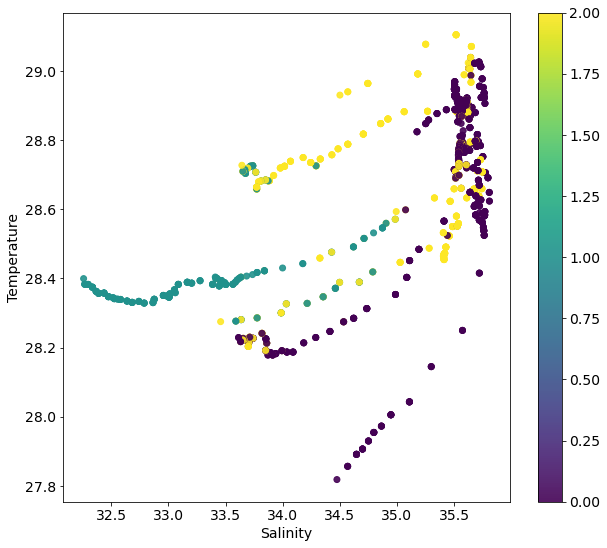

In [145]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(trios_gdf_transect['sal'].iloc[12:], trios_gdf_transect['temp'].iloc[12:], alpha=0.9, c=kmeans.labels_[12:], cmap='viridis', label='chla')

ax.set_xlabel("Salinity")
ax.set_ylabel("Temperature")


fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

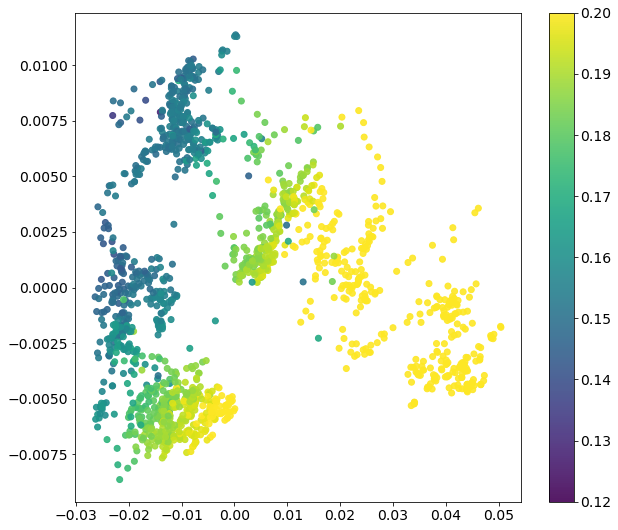

In [190]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_gdf_transect['chla_oci'].iloc[12:], vmin=.12,vmax=.20, cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

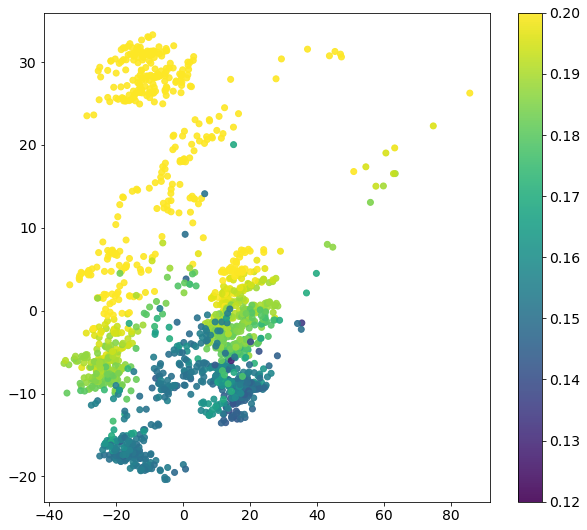

In [146]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_gdf_transect['chla_oci'].iloc[12:], vmin=.12,vmax=.20, cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

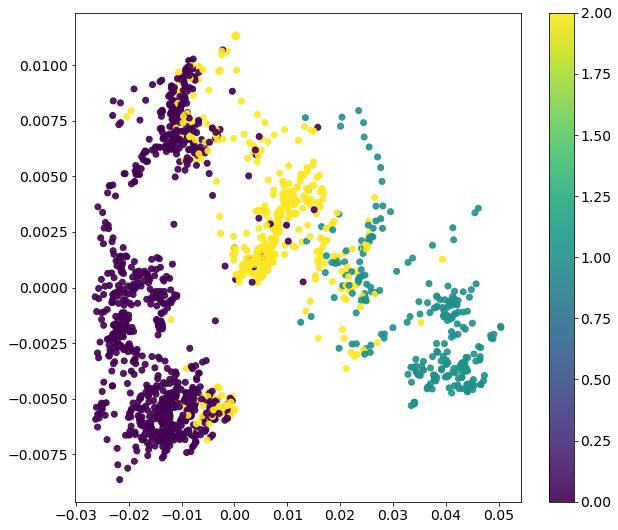

In [193]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=kmeans.labels_[12:], cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

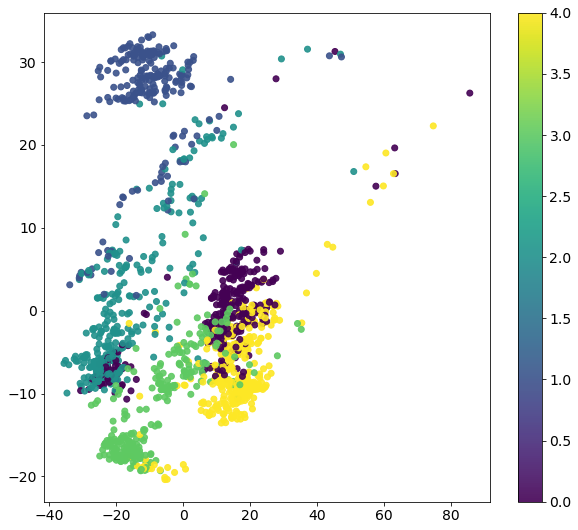

In [223]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=kmeans.labels_[12:], cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

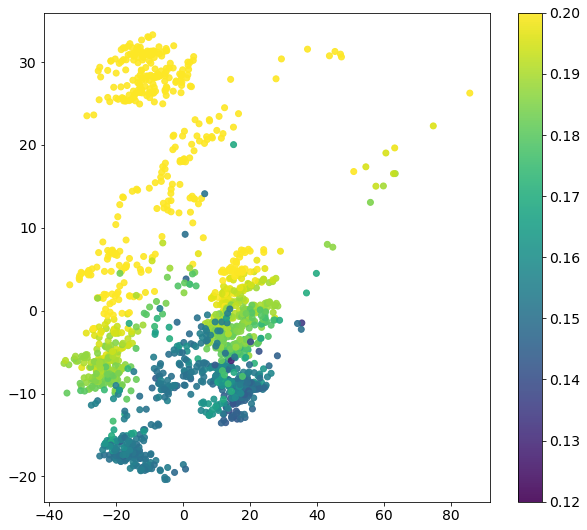

In [148]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(principalComponents[:,0], principalComponents[:,1], alpha=0.9, c=trios_gdf_transect['chla_oci'].iloc[12:], vmin=.12,vmax=.20, cmap='viridis', label='chla')
fig.colorbar(sc)
# ax.set_ylim(-3,2)
# ax.set_xlim(-6,8)
# fig.savefig('pca_transect.png')

In [149]:
# from sklearn.cluster import KMeans
# kmeans = KMeans(n_clusters=5, random_state=0).fit(x)
# np.unique(kmeans.labels_, return_counts=True)

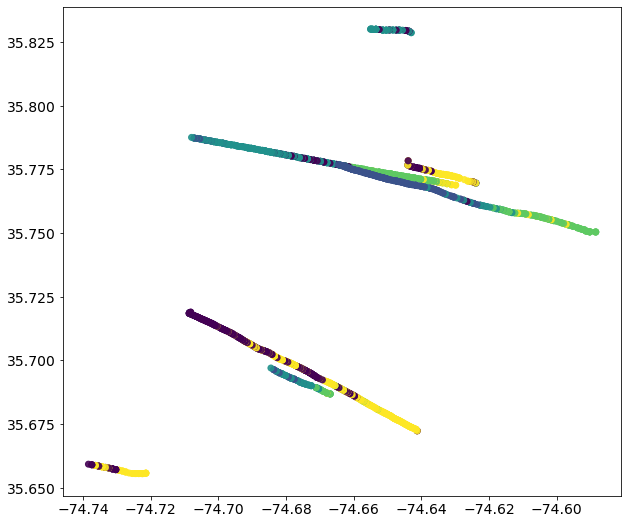

In [215]:
fig, ax = plt.subplots(figsize=(10,9))
sc = ax.scatter(trios_gdf_transect['lon'].iloc[12:], trios_gdf_transect['lat'].iloc[12:], alpha=0.9, c=kmeans.labels_[12:], cmap='viridis', label='chla')

ValueError: array([1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1, 1,
       1, 1, 1, 1, 1, 1, 1, 2, 1, 1, 2, 1, 1, 1, 1, 1, 1, 2, 2, 1, 1, 2,
       2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 2, 0, 2, 0, 2, 1, 1,
       1, 2, 2, 2, 2, 2, 2, 0, 0, 2, 0, 2, 0, 0, 2, 2, 0, 2, 0, 0, 0, 2,
       2, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2, 0,
       0, 0, 2, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 2, 2, 0, 0, 0, 0, 0, 2,
       2, 0, 2, 2, 0, 2, 0, 2, 2, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 2, 2, 0,
       2, 2, 0, 2, 2, 0, 0, 0, 0, 2, 0, 0, 0, 2, 2, 0, 2, 0, 0, 0, 0, 0,
       2, 2, 0, 0, 2, 2, 2, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 2,
       0, 0, 0, 0, 0, 0, 0, 0, 2, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0,
       0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 2], dtype=int32) is not a valid value for color

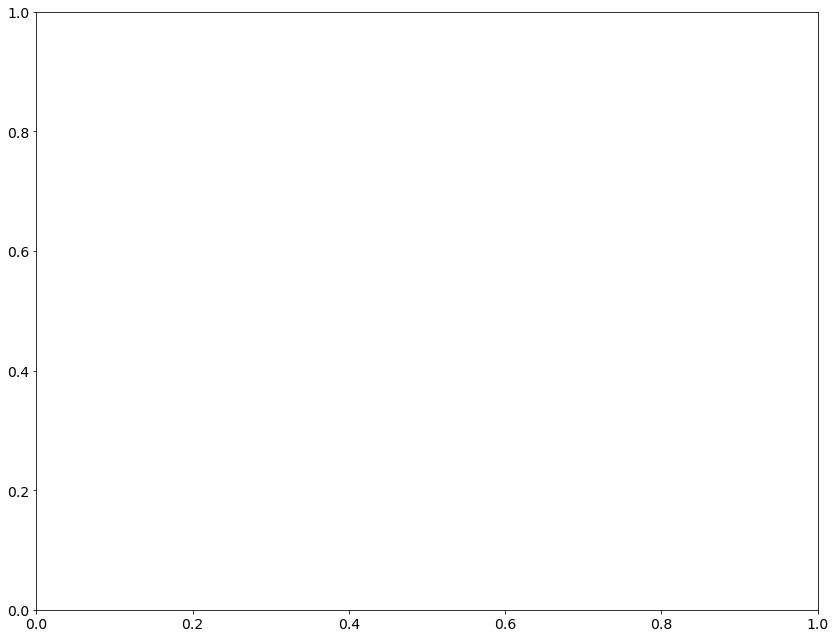

In [209]:
fig, ax = plt.subplots(figsize=(14,11))
ax.plot(trios_gdf_transect.iloc[12:].lon,trios_gdf_transect.iloc[12:].lon,c=kmeans.labels_,ax=ax, alpha=0.2, cmap='Set1')`a


In [151]:
len(x), len(kmeans.labels_[12:])

(1544, 1544)

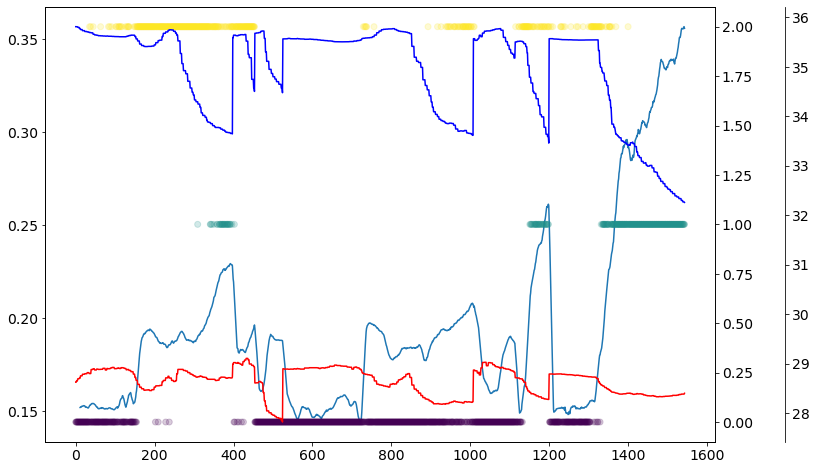

In [152]:
fig, ax  =plt.subplots(figsize=(12,8))
ax.plot(np.arange(0,len(x)),trios_gdf_transect.chla_oci.iloc[12:].rolling(window=12).mean())

ax2=ax.twinx()
ax2.scatter(np.arange(0,len(x)), kmeans.labels_[12:], alpha=0.2, c=kmeans.labels_[12:])

ax3 = ax.twinx()
ax3.plot(np.arange(0,len(x)),trios_gdf_transect['sal'].iloc[12:], color='blue')
ax3.plot(np.arange(0,len(x)),trios_gdf_transect['temp'].iloc[12:], color='red')
ax3.spines['right'].set_position(('outward', 70))

# fig.savefig('cluster_chla.png')